## Test corrections for gray systematics:  

#### NOT v3.3 but v3.4! 
#### use stripe82calibStars_v3.4.dat
#### and verify that RA/Dec corrections are flat and close to 0

In [1]:
%matplotlib inline
from astropy.table import Table
from astropy.coordinates import SkyCoord
from astropy import units as u
from astropy.table import hstack
import matplotlib.pyplot as plt 
import numpy as np
from astroML.plotting import hist
# for astroML installation see https://www.astroml.org/user_guide/installation.html

In [2]:
## automatically reload any modules read below that might have changed (e.g. plots)
%load_ext autoreload
%autoreload 2
# importing ZI and KT tools: 
import ZItools as zit
import KTtools as ktt

<a id='dataReading'></a>

### Define paths and catalogs 

In [8]:
ZIdataDir = "/Users/ivezic/Work/Science/CalibrationV2/SDSS_SSC/Data"
# the original SDSS catalog from 2007
sdssOldCat = ZIdataDir + "/" + "stripe82calibStars_v2.6.dat"
# tested catalog
# sdssNewCatIn = ZIdataDir + "/" + "stripe82calibStars_v3.3.dat"
# corrected for the ugiz offsets relative to v2.6 
sdssNewCatIn = ZIdataDir + "/" + "stripe82calibStars_v3.4.dat"
# sdssNewCatIn = ZIdataDir + "/" + "stripe82calibStars_v3.1_noheader_final.dat"
readFormat = 'ascii'

In [9]:
# both new and old files use identical data structure
colnamesSDSS = ['calib_fla', 'ra', 'dec', 'raRMS', 'decRMS', 'nEpochs', 'AR_val', 
                'u_Nobs', 'u_mMed', 'u_mMean', 'u_mErr', 'u_rms_scatt', 'u_chi2',
                'g_Nobs', 'g_mMed', 'g_mMean', 'g_mErr', 'g_rms_scatt', 'g_chi2',
                'r_Nobs', 'r_mMed', 'r_mMean', 'r_mErr', 'r_rms_scatt', 'r_chi2',
                'i_Nobs', 'i_mMed', 'i_mMean', 'i_mErr', 'i_rms_scatt', 'i_chi2',
                'z_Nobs', 'z_mMed', 'z_mMean', 'z_mErr', 'z_rms_scatt', 'z_chi2']

In [10]:
%%time
# old
sdssOld = Table.read(sdssOldCat, format='ascii', names=colnamesSDSS) 
np.size(sdssOld)

CPU times: user 23.3 s, sys: 4.41 s, total: 27.7 s
Wall time: 26.9 s


1006849

In [11]:
%%time
# new 
sdssNew = Table.read(sdssNewCatIn, format=readFormat, names=colnamesSDSS)
np.size(sdssNew)

CPU times: user 24.1 s, sys: 4.57 s, total: 28.7 s
Wall time: 27.4 s


991472

#### Simple positional match using ra/dec

In [12]:
sdssOld_coords = SkyCoord(ra = sdssOld['ra']*u.degree, dec= sdssOld['dec']*u.degree) 
sdssNew_coords = SkyCoord(ra = sdssNew['ra']*u.degree, dec= sdssNew['dec']*u.degree) 
# this is matching sdssNew to sdssOld, so that indices are into sdssNew catalog
# makes sense in this case since the sdssOld catalog is (a little bit) bigger 
# than sdssNew (1006849 vs 1005470)
idx, d2d, d3d = sdssNew_coords.match_to_catalog_sky(sdssOld_coords)  

In [13]:
# object separation is an object with units, 
# I add that as a column so that one can 
# select based on separation to the nearest matching object
new_old = hstack([sdssNew, sdssOld[idx]], table_names = ['new', 'old'])
new_old['sep_2d_arcsec'] = d2d.arcsec
# good matches between the old and new catalogs
MAX_DISTANCE_ARCSEC = 0.5
sdss = new_old[(new_old['sep_2d_arcsec'] < MAX_DISTANCE_ARCSEC)]
print(np.size(sdss))

991472


### apply standard cuts as in old catalog:


In [14]:
mOK3 = sdss[sdss['ra_new']<1]
mOK3 = zit.selectCatalog(sdss, mOK3)

starting with 991472
after Nobs cuts: 991472
after chi2 cuts: 991472
after r_mErr cut: 991437


In [15]:
print(996147/1006849)
print(993774/1006849)
print(991472/1006849)

0.989370799394944
0.9870139415145668
0.9847276006630588


### now analyze and make plots

In [16]:
### code for generating new quantities, such as dra, ddec, colors, differences in mags, etc
def derivedColumns(matches):
    matches['dra'] = (matches['ra_new']-matches['ra_old'])*3600
    matches['ddec'] = (matches['dec_new']-matches['dec_old'])*3600
    matches['ra'] = matches['ra_new']
    ra = matches['ra'] 
    matches['raW'] = np.where(ra > 180, ra-360, ra) 
    matches['dec'] = matches['dec_new']
    matches['u'] = matches['u_mMed_new']
    matches['g'] = matches['g_mMed_new']
    matches['r'] = matches['r_mMed_new']
    matches['i'] = matches['i_mMed_new']
    matches['z'] = matches['z_mMed_new']
    matches['ug'] = matches['u_mMed_new'] - matches['g_mMed_new']
    matches['gr'] = matches['g_mMed_new'] - matches['r_mMed_new']
    matches['ri'] = matches['r_mMed_new'] - matches['i_mMed_new']
    matches['gi'] = matches['g_mMed_new'] - matches['i_mMed_new']
    matches['iz'] = matches['i_mMed_new'] - matches['z_mMed_new']
    matches['du'] = matches['u_mMed_new'] - matches['u_mMed_old']
    matches['dg'] = matches['g_mMed_new'] - matches['g_mMed_old']
    matches['dr'] = matches['r_mMed_new'] - matches['r_mMed_old']
    matches['di'] = matches['i_mMed_new'] - matches['i_mMed_old']
    matches['dz'] = matches['z_mMed_new'] - matches['z_mMed_old']
    matches['dgi'] = matches['dg'] - matches['di']   
    
    ## s color from the stellar locus in the g-r vs. u-g color-color diagram
    # only should be used with mask = (sP1 > -0.2) & (sP1 < 0.8)
    matches['s_new'] = -0.249 * matches['u_mMed_new'] + 0.794 * matches['g_mMed_new'] - 0.555 * matches['r_mMed_new'] + 0.224 
    matches['s_old'] = -0.249 * matches['u_mMed_old'] + 0.794 * matches['g_mMed_old'] - 0.555 * matches['r_mMed_old'] + 0.224 
    matches['sP1_new'] = 0.910 * matches['u_mMed_new'] - 0.495 * matches['g_mMed_new'] - 0.415 * matches['r_mMed_new'] - 1.28 
    matches['sP1_old'] = 0.910 * matches['u_mMed_old'] - 0.495 * matches['g_mMed_old'] - 0.415 * matches['r_mMed_old'] - 1.28 

    ## w color from the stellar locus in the r-i vs. g-r color-color diagram
    # only should be used with mask = (gr > 0.3) & (gr < 1.0)
    matches['w_new'] = -0.227 * matches['g_mMed_new'] + 0.792 * matches['r_mMed_new'] - 0.567 * matches['i_mMed_new'] + 0.042 
    matches['w_old'] = -0.227 * matches['g_mMed_old'] + 0.792 * matches['r_mMed_old'] - 0.567 * matches['i_mMed_old'] + 0.042 

    ## y color from the stellar locus in the i-z vs. r-i color-color diagram
    # only should be used with mask = (yP1 > 0.1) & (yP1 < 1.2)
    matches['y_new'] = -0.27 * matches['r_mMed_new'] + 0.80 * matches['i_mMed_new'] - 0.534 * matches['z_mMed_new'] + 0.049
    matches['y_old'] = -0.27 * matches['r_mMed_old'] + 0.80 * matches['i_mMed_old'] - 0.534 * matches['z_mMed_old'] + 0.049 
    matches['yP1_new'] = 0.895 * matches['r_mMed_new'] - 0.448 * matches['i_mMed_new'] - 0.447 * matches['z_mMed_new'] - 0.600
    matches['yP1_old'] = 0.895 * matches['r_mMed_old'] - 0.448 * matches['i_mMed_old'] - 0.447 * matches['z_mMed_old'] - 0.600
    
    return

def printStats(matches, column, Amax = 1.0):
    arrRaw = matches[column]
    arr = arrRaw[(arrRaw>-Amax)&(arrRaw<Amax)]
    # print('arr=', column, ' min=', np.min(arr), ' max=', np.max(arr))
    # print(column, '    median=', np.median(arr), ' sigG:', zit.sigG(arr))
    print(column, ' &', np.median(arr), ' &', zit.sigG(arr))

In [17]:
derivedColumns(sdss) 
derivedColumns(mOK3) 

In [18]:
for q in ('dra', 'ddec', 'dgi', 'du', 'dg', 'dr', 'di', 'dz'):
    printStats(mOK3, q)

dra  & 0.019800000154646114  & 0.0880307999293791
ddec  & -0.010799999999910881  & 0.013871520000102722
dgi  & -0.0010000000000012221  & 0.019265999999999853
du  & 0.012000000000000455  & 0.060020999999999644
dg  & 0.0009999999999976694  & 0.018524999999998945
dr  & 0.0009999999999994458  & 0.0125969999999996
di  & 0.0010000000000012221  & 0.012597000000000916
dz  & 0.0  & 0.021488999999999935


In [19]:
## note rms = 0.06 mag for u above, inspect plots!

In [20]:
def doOneBand(d, kw):
    print('=========== WORKING ON:', kw['Ystr'], '===================')
    xVec = d[kw['Xstr']]
    yVec = d[kw['Ystr']]
    goodC = d[np.abs(d[kw['Ystr']])<0.3] 

    ### plots 
    # RA
    print(' stats for RA binning medians:')
    plotNameRoot = kw['plotNameRoot'] + kw['Xstr'] + '_' + kw['Ystr']
    plotName = plotNameRoot + '_RA.png'
    Ylabel = kw['Ystr'] + ' (mag)'
    kwOC = {"Xstr":'raW', "Xmin":-52, "Xmax":60.5, "Xlabel":'R.A. (deg)', \
          "Ystr":kw['Ystr'], "Ymin":-0.07, "Ymax":0.07, "Ylabel":Ylabel, \
          "XminBin":-51.5, "XmaxBin":58, "nBin":56, \
          "plotName":plotName, "Nsigma":3, "offset":0.01, "symbSize":kw['symbSize']}
    zit.plotdelMag(goodC, kwOC)
    plotName = plotNameRoot + '_RA_Hess.png'    
    kwOC["plotName"] = plotName
    kwOC["nBinX"] = 55
    kwOC["nBinY"] = 25
    kwOC["cmap"] = 'plasma'
    ktt.plotdelMagBW_KT(goodC, kwOC)  
    print('made plot', plotName)

    # Dec
    print('-----------')
    print(' stats for Dec binning medians:')
    plotName = plotNameRoot + '_Dec.png'
    kwOC = {"Xstr":'dec', "Xmin":-1.3, "Xmax":1.3, "Xlabel":'Declination (deg)', \
          "Ystr":kw['Ystr'], "Ymin":-0.07, "Ymax":0.07, "Ylabel":Ylabel, \
          "XminBin":-1.26, "XmaxBin":1.26, "nBin":52, \
          "plotName":plotName, "Nsigma":3, "offset":0.01, "symbSize":kw['symbSize']}
    zit.plotdelMag(goodC, kwOC)
    plotName = plotNameRoot + '_Dec_Hess.png'    
    kwOC["plotName"] = plotName
    kwOC["nBinX"] = 55
    kwOC["nBinY"] = 25
    kwOC["cmap"] = 'plasma'
    ktt.plotdelMagBW_KT(goodC, kwOC)
    print('made plot', plotName)

    # vs supplied X 
    print('-----------')
    print(' stats for SDSS r binning medians:')
    plotName = plotNameRoot + '_rmag.png'    
    Xlabel = kw['Xstr'] + ' (mag)'
    kwOC = {"Xstr":kw['Xstr'], "Xmin":14.3, "Xmax":22.2, "Xlabel":Xlabel, \
          "Ystr":kw['Ystr'], "Ymin":-0.07, "Ymax":0.07, "Ylabel":Ylabel, \
          "XminBin":14.5, "XmaxBin":21.5, "nBin":55, \
          "plotName":plotName, "Nsigma":3, "offset":0.01, "symbSize":kw['symbSize']}
    zit.plotdelMag(goodC, kwOC)
    plotName = plotNameRoot + '_' + kw['Xstr'] + '_mag_Hess.png'    
    kwOC["plotName"] = plotName
    kwOC["nBinX"] = 55
    kwOC["nBinY"] = 25
    kwOC["cmap"] = 'plasma'
    ktt.plotdelMagBW_KT(goodC, kwOC)
    print('made plot', plotName)
    print('------------------------------------------------------------------')
    return    

=========== WORKING ON: du ===================
 stats for RA binning medians:
medianAll: 0.0070000000000014495 std.dev.All: 0.04890600000000185
N= 533148 min= -0.29999999999999716 max= 0.29999999999999716
median: 0.006999999999997897 std.dev: 0.0023640995826600558
saved plot as: testV26vsV33_u_du_RA.png


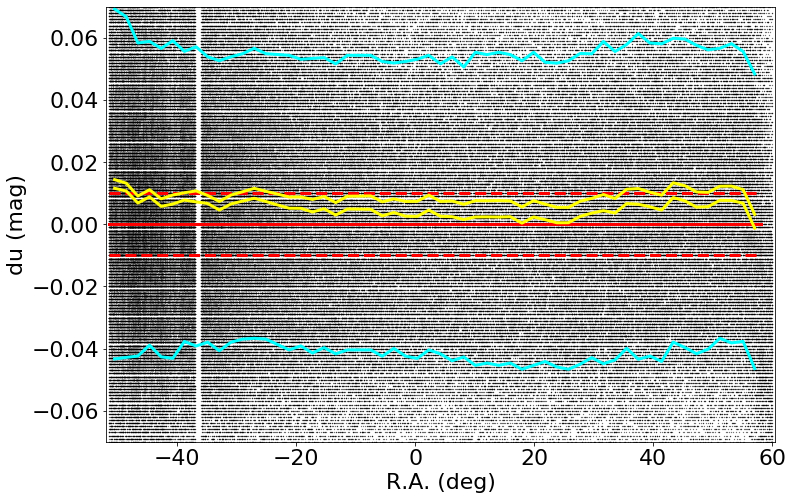

medianAll: 0.0070000000000014495 std.dev.All: 0.04890600000000185
N= 533148 min= -0.29999999999999716 max= 0.29999999999999716
median: 0.0070000000000014495 std.dev: 0.0023298281424928404
saved plot as: testV26vsV33_u_du_RA_Hess.png


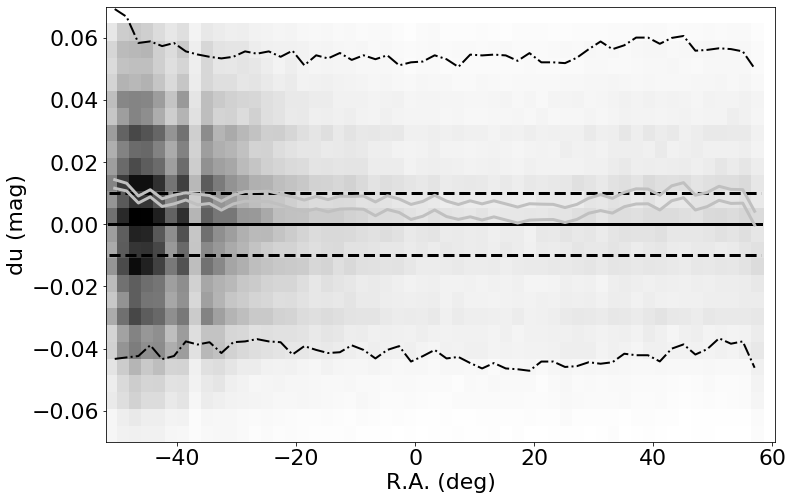

made plot testV26vsV33_u_du_RA_Hess.png
-----------
 stats for Dec binning medians:
medianAll: 0.0070000000000014495 std.dev.All: 0.04890600000000185
N= 533148 min= -0.29999999999999716 max= 0.29999999999999716
median: 0.006499999999999062 std.dev: 0.025495349602062255
saved plot as: testV26vsV33_u_du_Dec.png


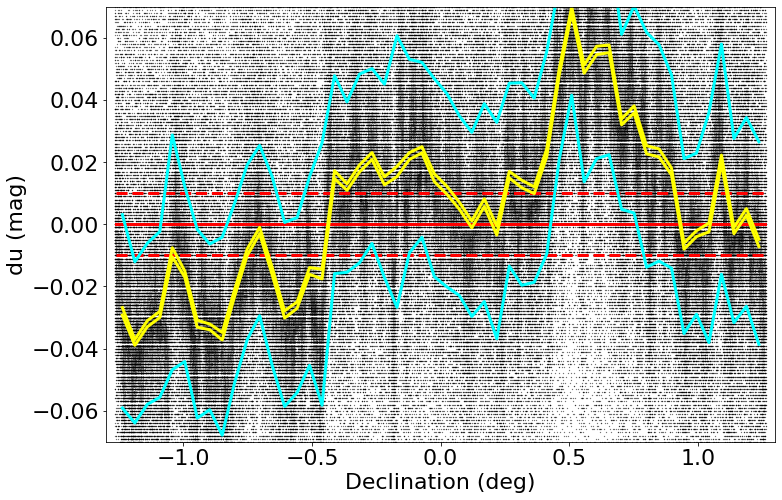

medianAll: 0.0070000000000014495 std.dev.All: 0.04890600000000185
N= 533148 min= -0.29999999999999716 max= 0.29999999999999716
median: 0.006000000000000227 std.dev: 0.025804926174589866
saved plot as: testV26vsV33_u_du_Dec_Hess.png


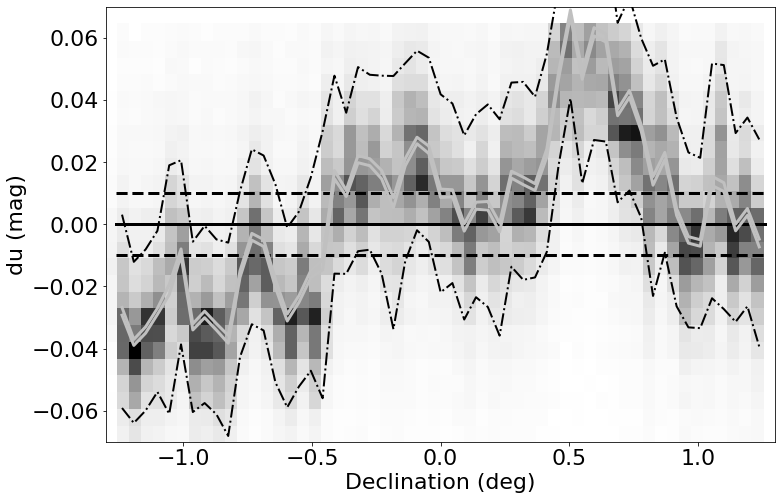

made plot testV26vsV33_u_du_Dec_Hess.png
-----------
 stats for SDSS r binning medians:
medianAll: 0.0070000000000014495 std.dev.All: 0.04890600000000185
N= 533148 min= -0.29999999999999716 max= 0.29999999999999716
median: 0.0 std.dev: 0.012694555350117352
saved plot as: testV26vsV33_u_du_rmag.png


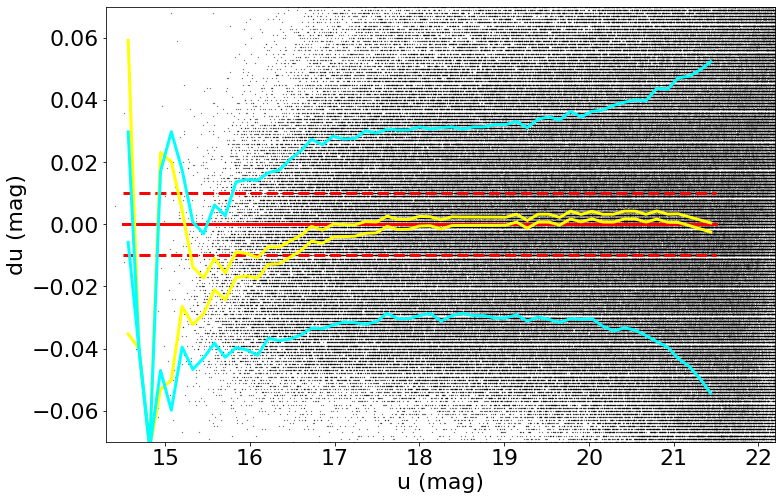

medianAll: 0.0070000000000014495 std.dev.All: 0.04890600000000185
N= 533148 min= -0.29999999999999716 max= 0.29999999999999716
median: 0.0 std.dev: 0.012694555350117352
saved plot as: testV26vsV33_u_du_u_mag_Hess.png


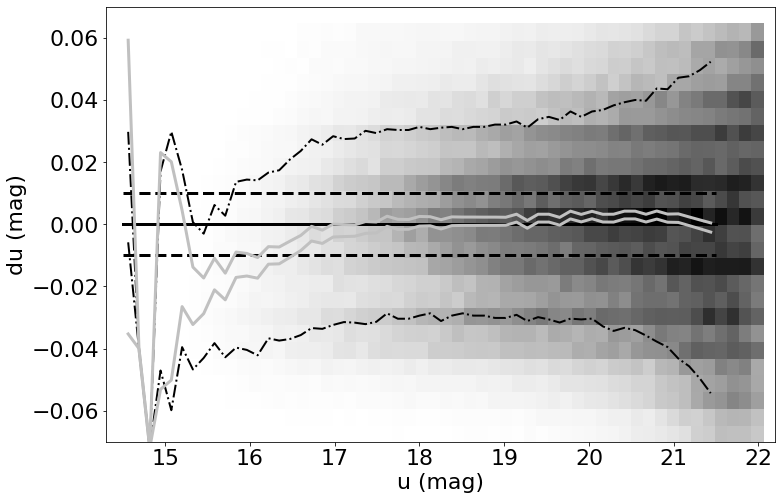

made plot testV26vsV33_u_du_u_mag_Hess.png
------------------------------------------------------------------


In [21]:
keywords = {"Xstr":'u', "plotNameRoot":'testV26vsV33_', "symbSize":0.05}
keywords["Ystr"] = 'du'
doOneBand(mOK3, keywords)

=========== WORKING ON: dg ===================
 stats for RA binning medians:
medianAll: 0.0009999999999976694 std.dev.All: 0.018524999999998945
N= 989185 min= -0.29900000000000304 max= 0.29999999999999716
median: -0.0004999999999988347 std.dev: 0.004527939061301322
saved plot as: testV26vsV33_g_dg_RA.png


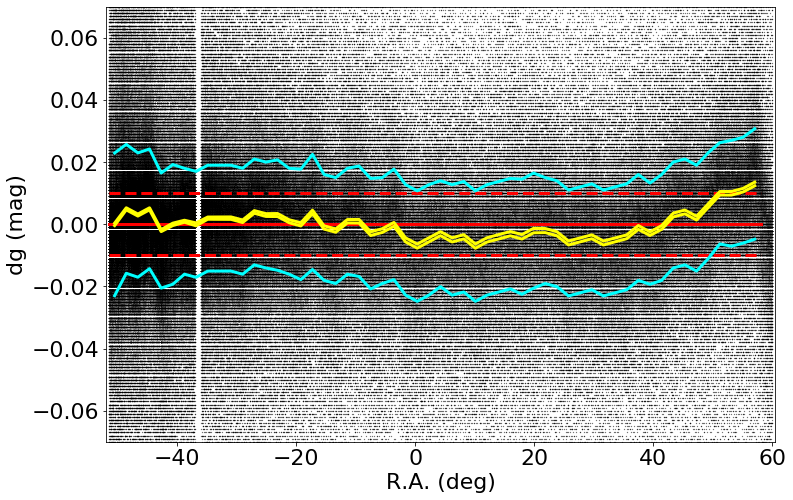

medianAll: 0.0009999999999976694 std.dev.All: 0.018524999999998945
N= 989185 min= -0.29900000000000304 max= 0.29999999999999716
median: -0.0010000000000012221 std.dev: 0.0044778241469392915
saved plot as: testV26vsV33_g_dg_RA_Hess.png


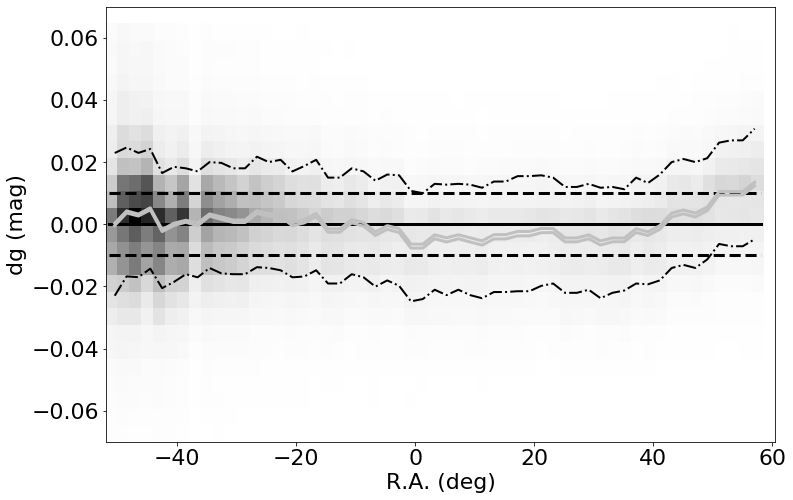

made plot testV26vsV33_g_dg_RA_Hess.png
-----------
 stats for Dec binning medians:
medianAll: 0.0009999999999976694 std.dev.All: 0.018524999999998945
N= 989185 min= -0.29900000000000304 max= 0.29999999999999716
median: 0.002000000000000668 std.dev: 0.009377736287069434
saved plot as: testV26vsV33_g_dg_Dec.png


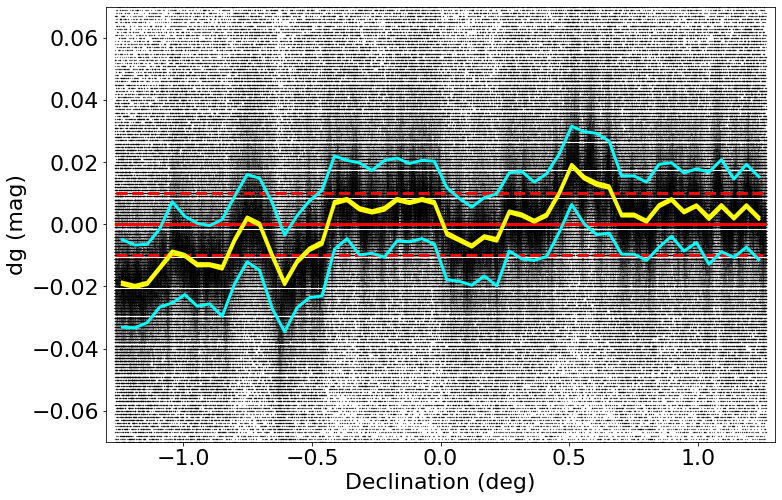

medianAll: 0.0009999999999976694 std.dev.All: 0.018524999999998945
N= 989185 min= -0.29900000000000304 max= 0.29999999999999716
median: 0.0030000000000001137 std.dev: 0.009312499376005229
saved plot as: testV26vsV33_g_dg_Dec_Hess.png


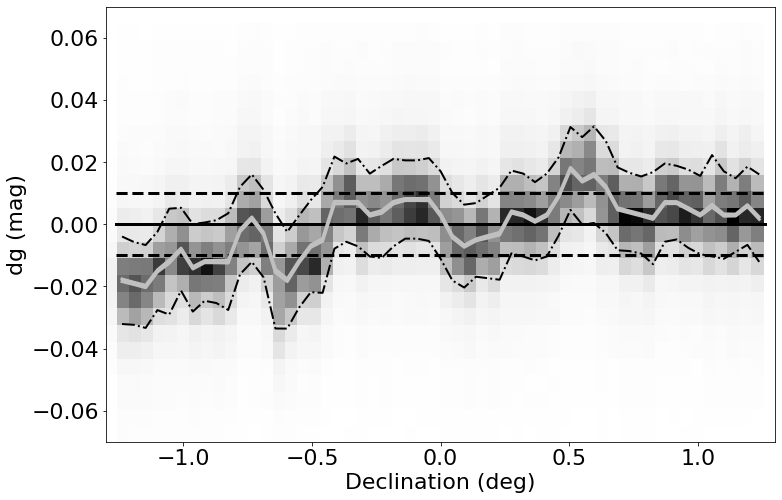

made plot testV26vsV33_g_dg_Dec_Hess.png
-----------
 stats for SDSS r binning medians:
medianAll: 0.0009999999999976694 std.dev.All: 0.018524999999998945
N= 989185 min= -0.29900000000000304 max= 0.29999999999999716
median: 0.0 std.dev: 0.0016317105560863063
saved plot as: testV26vsV33_g_dg_rmag.png


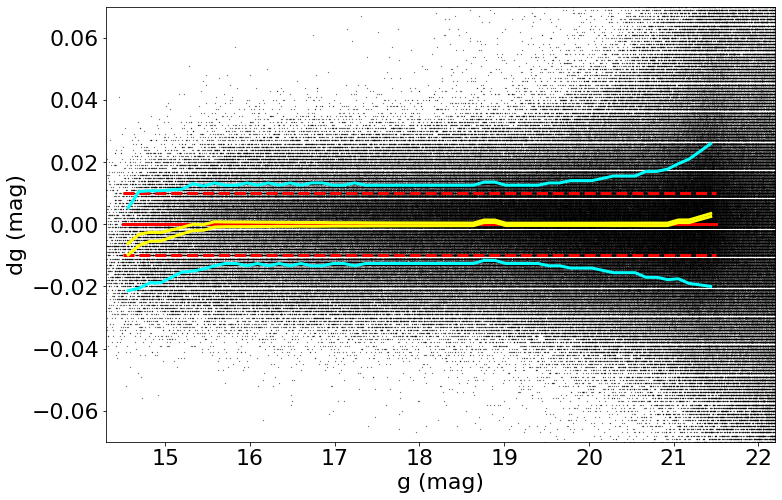

medianAll: 0.0009999999999976694 std.dev.All: 0.018524999999998945
N= 989185 min= -0.29900000000000304 max= 0.29999999999999716
median: 0.0 std.dev: 0.0016317105560863063
saved plot as: testV26vsV33_g_dg_g_mag_Hess.png


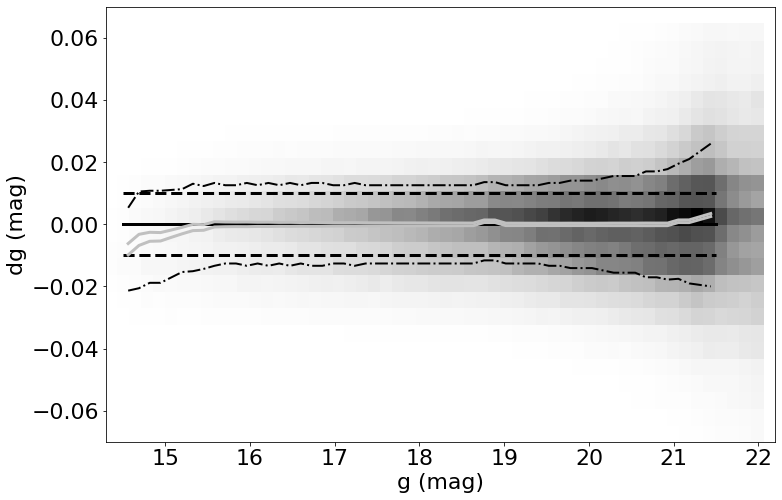

made plot testV26vsV33_g_dg_g_mag_Hess.png
------------------------------------------------------------------


In [22]:
keywords = {"Xstr":'g', "plotNameRoot":'testV26vsV33_', "symbSize":0.05}
keywords["Ystr"] = 'dg'
doOneBand(mOK3, keywords)

=========== WORKING ON: dr ===================
 stats for RA binning medians:
medianAll: 0.0009999999999994458 std.dev.All: 0.0125969999999996
N= 991291 min= -0.26599999999999824 max= 0.2980000000000018
median: 0.0 std.dev: 0.001918957518858622
saved plot as: testV26vsV33_r_dr_RA.png


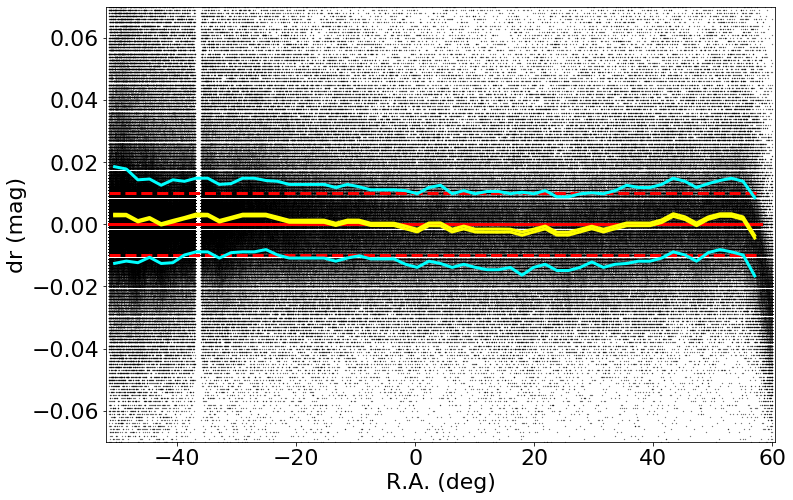

medianAll: 0.0009999999999994458 std.dev.All: 0.0125969999999996
N= 991291 min= -0.26599999999999824 max= 0.2980000000000018
median: 0.0 std.dev: 0.001950969244180187
saved plot as: testV26vsV33_r_dr_RA_Hess.png


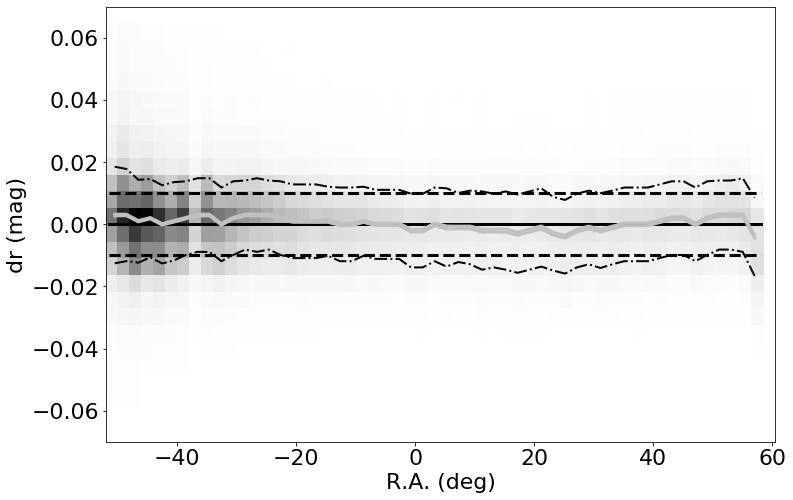

made plot testV26vsV33_r_dr_RA_Hess.png
-----------
 stats for Dec binning medians:
medianAll: 0.0009999999999994458 std.dev.All: 0.0125969999999996
N= 991291 min= -0.26599999999999824 max= 0.2980000000000018
median: 0.0009999999999976694 std.dev: 0.00699630079771198
saved plot as: testV26vsV33_r_dr_Dec.png


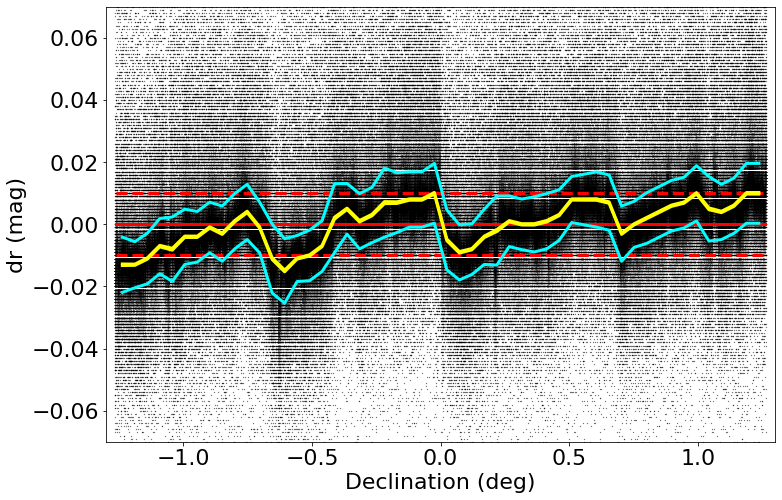

medianAll: 0.0009999999999994458 std.dev.All: 0.0125969999999996
N= 991291 min= -0.26599999999999824 max= 0.2980000000000018
median: 0.0009999999999976694 std.dev: 0.006844820687785541
saved plot as: testV26vsV33_r_dr_Dec_Hess.png


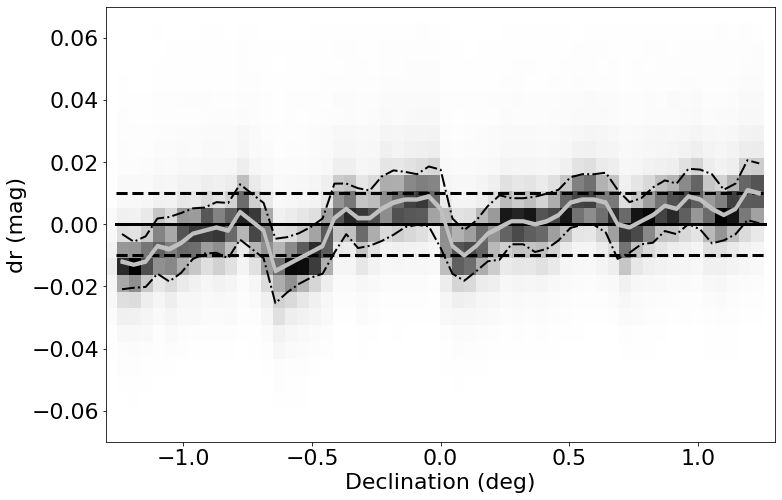

made plot testV26vsV33_r_dr_Dec_Hess.png
-----------
 stats for SDSS r binning medians:
medianAll: 0.0009999999999994458 std.dev.All: 0.0125969999999996
N= 991291 min= -0.26599999999999824 max= 0.2980000000000018
median: 0.0 std.dev: 0.0018854817215540156
saved plot as: testV26vsV33_r_dr_rmag.png


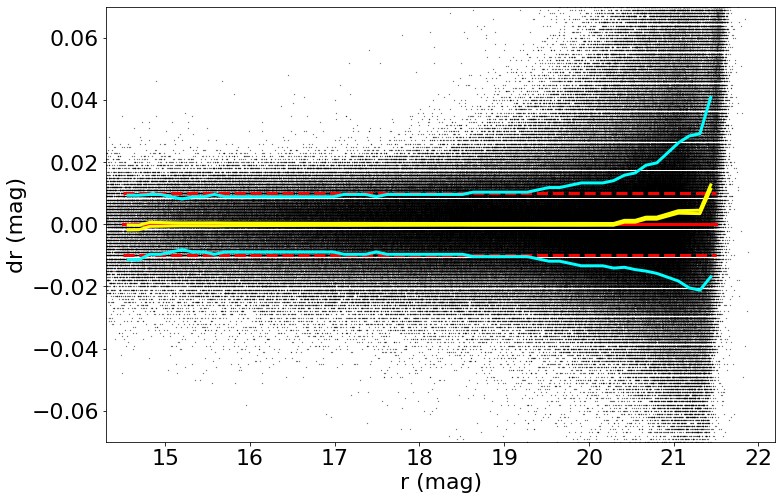

medianAll: 0.0009999999999994458 std.dev.All: 0.0125969999999996
N= 991291 min= -0.26599999999999824 max= 0.2980000000000018
median: 0.0 std.dev: 0.0018854817215540156
saved plot as: testV26vsV33_r_dr_r_mag_Hess.png


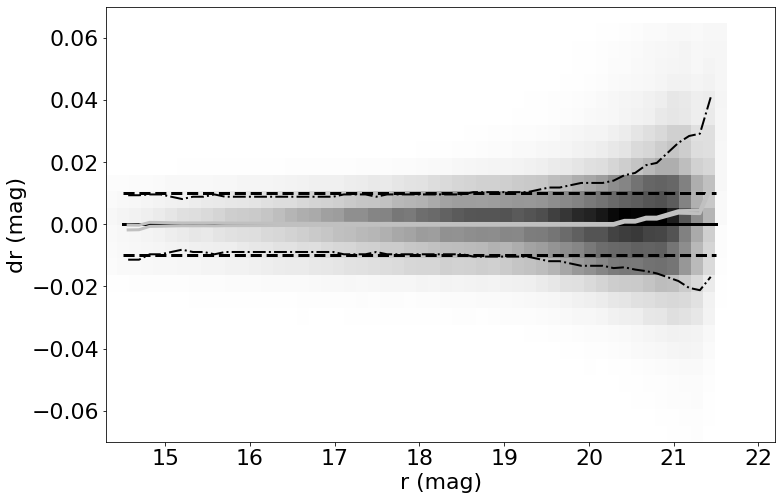

made plot testV26vsV33_r_dr_r_mag_Hess.png
------------------------------------------------------------------


In [23]:
keywords = {"Xstr":'r', "plotNameRoot":'testV26vsV33_', "symbSize":0.05}
keywords["Ystr"] = 'dr'
doOneBand(mOK3, keywords)

=========== WORKING ON: di ===================
 stats for RA binning medians:
medianAll: 0.0010000000000012221 std.dev.All: 0.012597000000000916
N= 991109 min= -0.2920000000000016 max= 0.2980000000000018
median: -0.001000000000000334 std.dev: 0.005280402736650083
saved plot as: testV26vsV33_i_di_RA.png


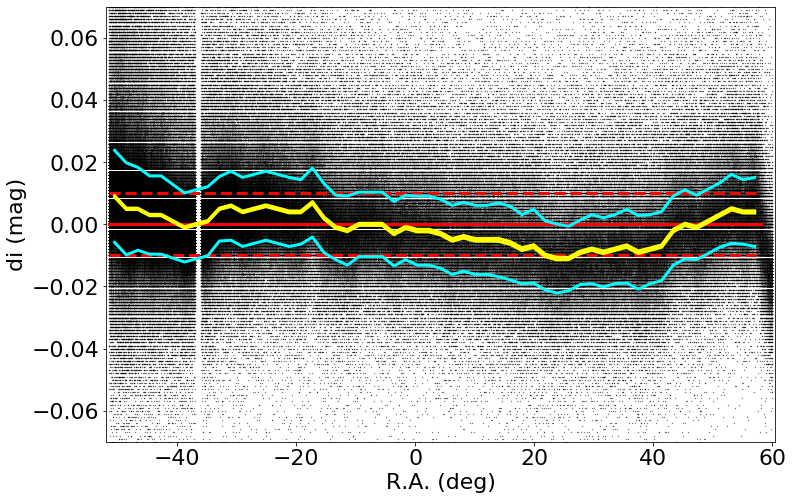

medianAll: 0.0010000000000012221 std.dev.All: 0.012597000000000916
N= 991109 min= -0.2920000000000016 max= 0.2980000000000018
median: -0.0010000000000012221 std.dev: 0.005219036990426282
saved plot as: testV26vsV33_i_di_RA_Hess.png


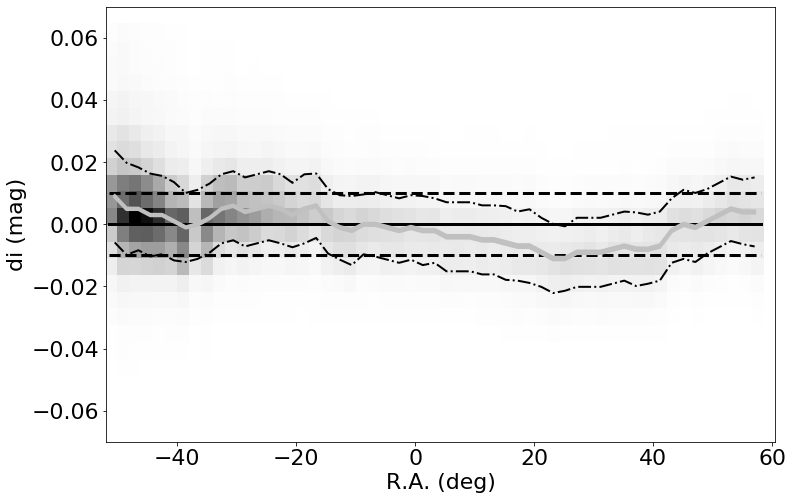

made plot testV26vsV33_i_di_RA_Hess.png
-----------
 stats for Dec binning medians:
medianAll: 0.0010000000000012221 std.dev.All: 0.012597000000000916
N= 991109 min= -0.2920000000000016 max= 0.2980000000000018
median: 0.0010000000000012221 std.dev: 0.006454752618105883
saved plot as: testV26vsV33_i_di_Dec.png


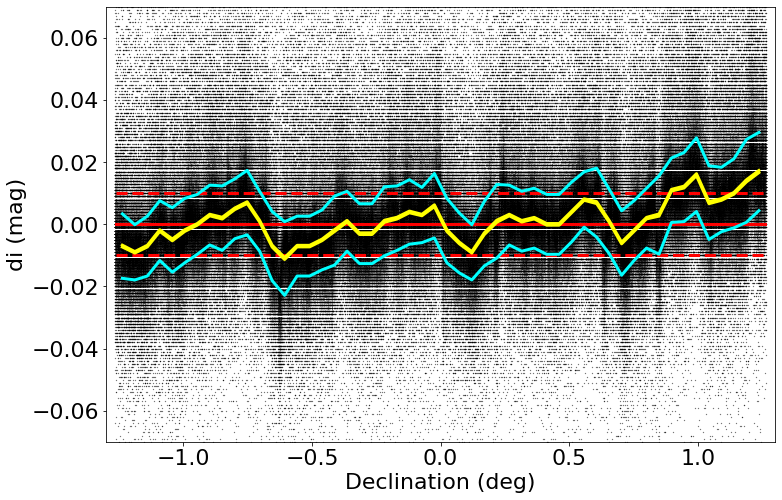

medianAll: 0.0010000000000012221 std.dev.All: 0.012597000000000916
N= 991109 min= -0.2920000000000016 max= 0.2980000000000018
median: 0.0009999999999994458 std.dev: 0.006510614346861005
saved plot as: testV26vsV33_i_di_Dec_Hess.png


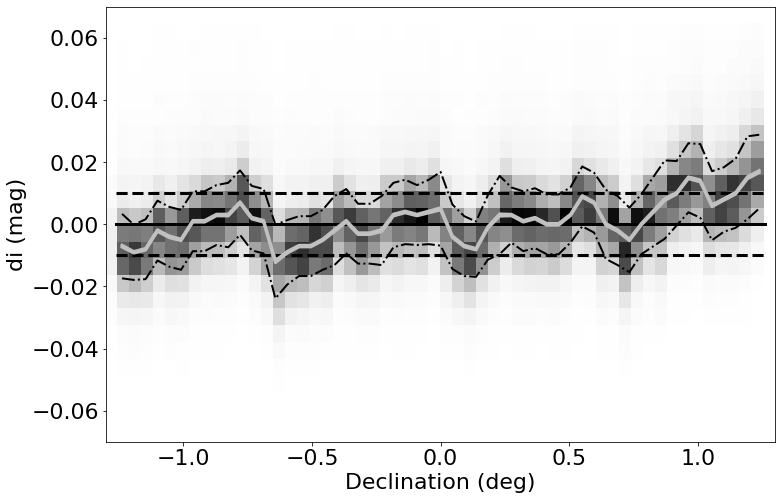

made plot testV26vsV33_i_di_Dec_Hess.png
-----------
 stats for SDSS r binning medians:
medianAll: 0.0010000000000012221 std.dev.All: 0.012597000000000916
N= 991109 min= -0.2920000000000016 max= 0.2980000000000018
median: 0.0 std.dev: 0.002357509541798268
saved plot as: testV26vsV33_i_di_rmag.png


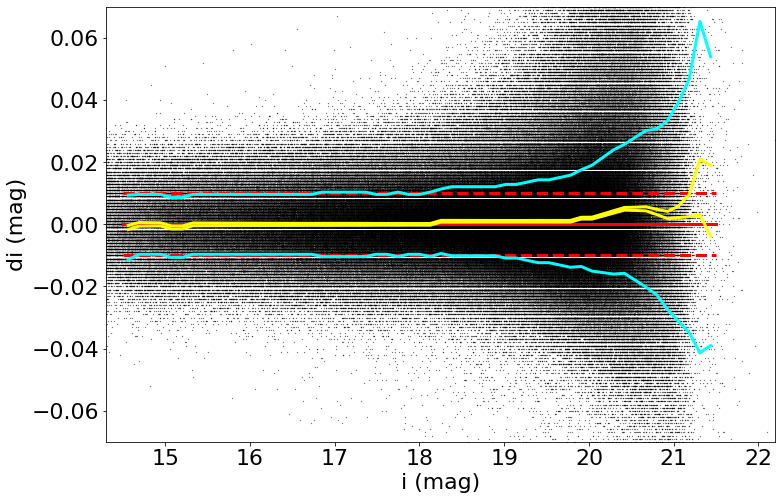

medianAll: 0.0010000000000012221 std.dev.All: 0.012597000000000916
N= 991109 min= -0.2920000000000016 max= 0.2980000000000018
median: 0.0 std.dev: 0.002357509541798268
saved plot as: testV26vsV33_i_di_i_mag_Hess.png


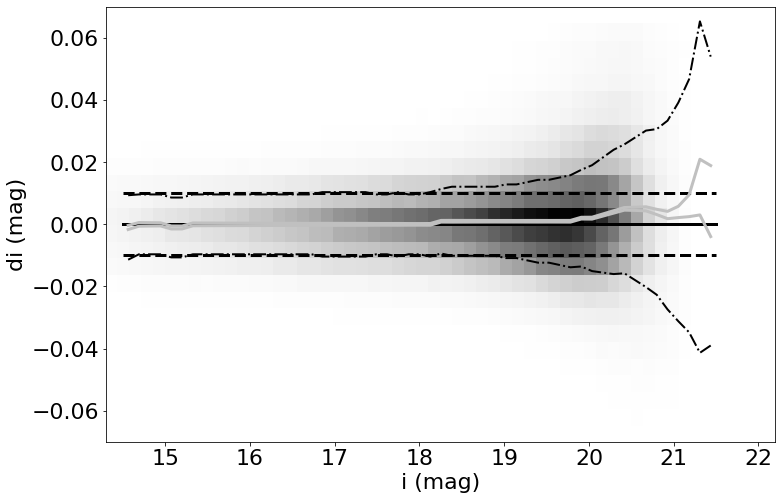

made plot testV26vsV33_i_di_i_mag_Hess.png
------------------------------------------------------------------


In [24]:
keywords = {"Xstr":'i', "plotNameRoot":'testV26vsV33_', "symbSize":0.05}
keywords["Ystr"] = 'di'
doOneBand(mOK3, keywords)

=========== WORKING ON: dz ===================
 stats for RA binning medians:
medianAll: 0.0 std.dev.All: 0.021488999999997305
N= 988313 min= -0.29999999999999716 max= 0.29999999999999716
median: -0.0029999999999983373 std.dev: 0.008929714212580828
saved plot as: testV26vsV33_z_dz_RA.png


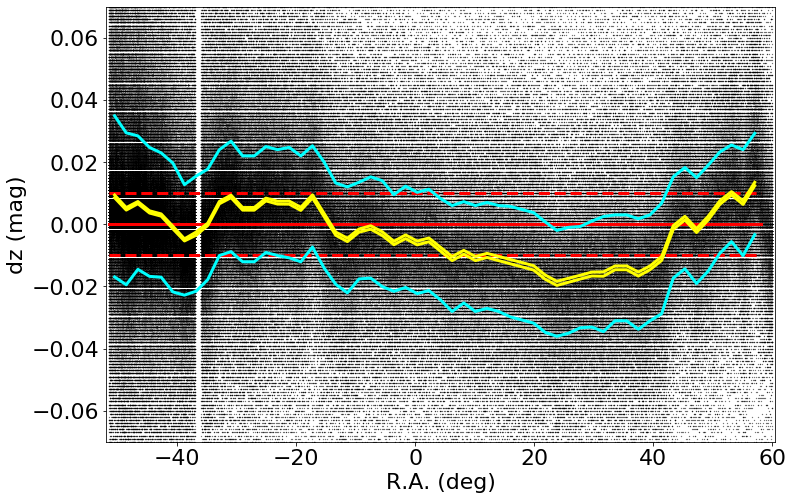

medianAll: 0.0 std.dev.All: 0.021488999999997305
N= 988313 min= -0.29999999999999716 max= 0.29999999999999716
median: -0.0030000000000001137 std.dev: 0.008952740934927695
saved plot as: testV26vsV33_z_dz_RA_Hess.png


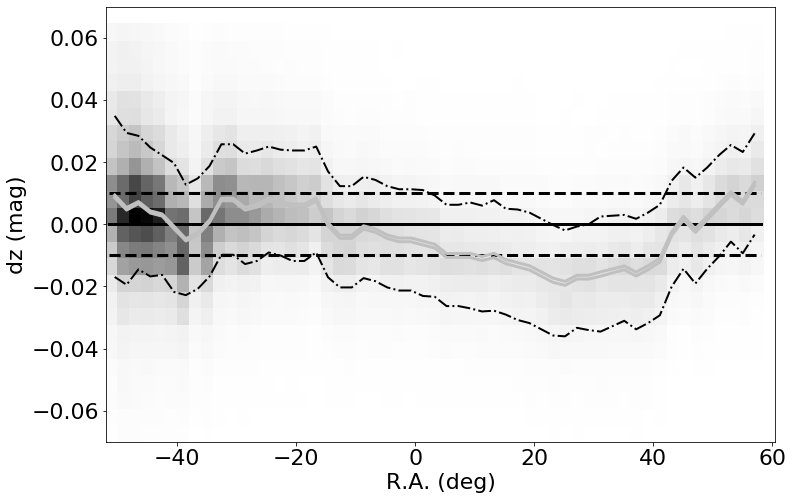

made plot testV26vsV33_z_dz_RA_Hess.png
-----------
 stats for Dec binning medians:
medianAll: 0.0 std.dev.All: 0.021488999999997305
N= 988313 min= -0.29999999999999716 max= 0.29999999999999716
median: 0.0004999999999988347 std.dev: 0.008416752103770889
saved plot as: testV26vsV33_z_dz_Dec.png


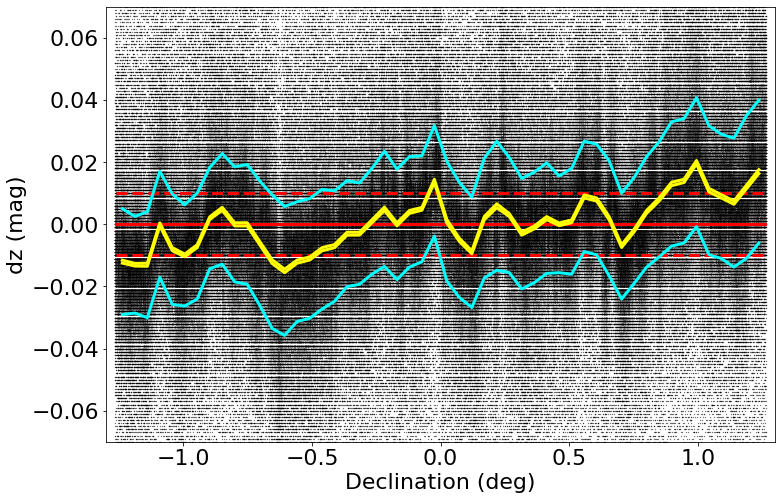

medianAll: 0.0 std.dev.All: 0.021488999999997305
N= 988313 min= -0.29999999999999716 max= 0.29999999999999716
median: 0.0 std.dev: 0.008404917883483461
saved plot as: testV26vsV33_z_dz_Dec_Hess.png


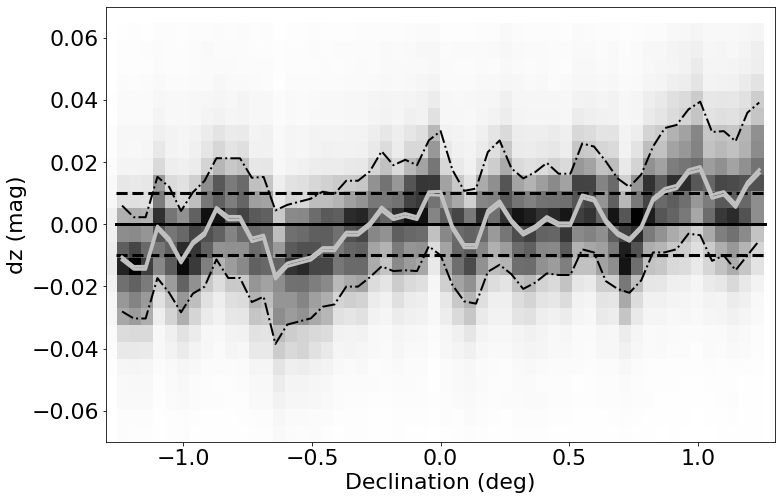

made plot testV26vsV33_z_dz_Dec_Hess.png
-----------
 stats for SDSS r binning medians:
medianAll: 0.0 std.dev.All: 0.021488999999997305
N= 988313 min= -0.29999999999999716 max= 0.29999999999999716
median: 0.0 std.dev: 0.03256929548308439
saved plot as: testV26vsV33_z_dz_rmag.png


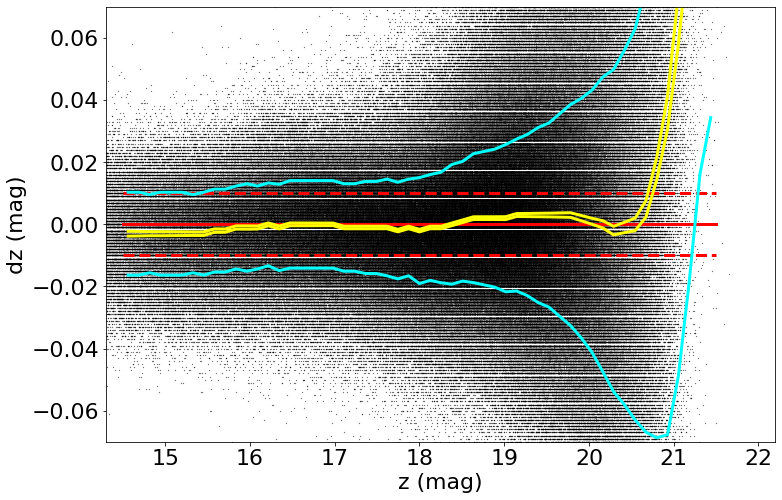

medianAll: 0.0 std.dev.All: 0.021488999999997305
N= 988313 min= -0.29999999999999716 max= 0.29999999999999716
median: 0.0 std.dev: 0.03256929548308439
saved plot as: testV26vsV33_z_dz_z_mag_Hess.png


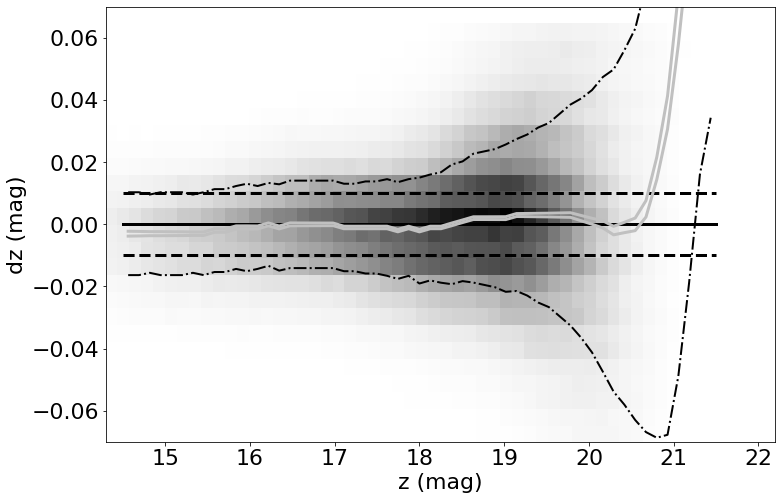

made plot testV26vsV33_z_dz_z_mag_Hess.png
------------------------------------------------------------------


In [25]:
keywords = {"Xstr":'z', "plotNameRoot":'testV26vsV33_', "symbSize":0.05}
keywords["Ystr"] = 'dz'
doOneBand(mOK3, keywords)

=========== WORKING ON: dgi ===================
 stats for RA binning medians:
medianAll: -0.0010000000000012221 std.dev.All: 0.019265999999999853
N= 989623 min= -0.29900000000000304 max= 0.29999999999999716
median: 0.0 std.dev: 0.003940363794972908
saved plot as: testV26vsV33_r_dgi_RA.png


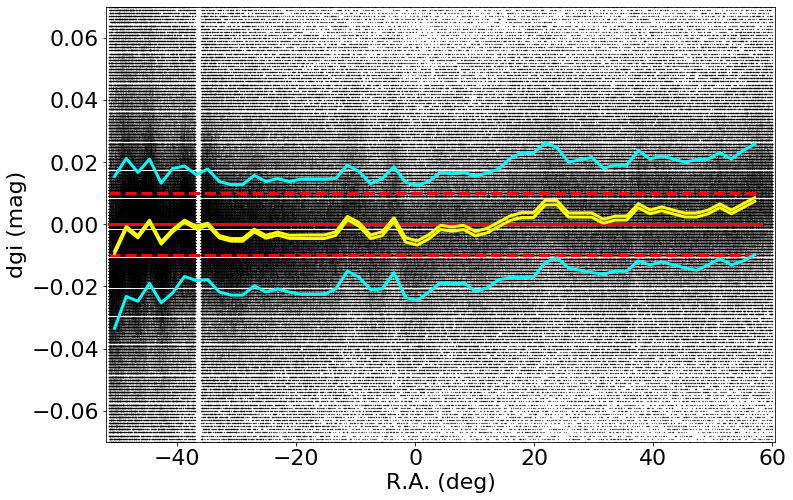

medianAll: -0.0010000000000012221 std.dev.All: 0.019265999999999853
N= 989623 min= -0.29900000000000304 max= 0.29999999999999716
median: -0.0009999999999976694 std.dev: 0.003875159287582166
saved plot as: testV26vsV33_r_dgi_RA_Hess.png


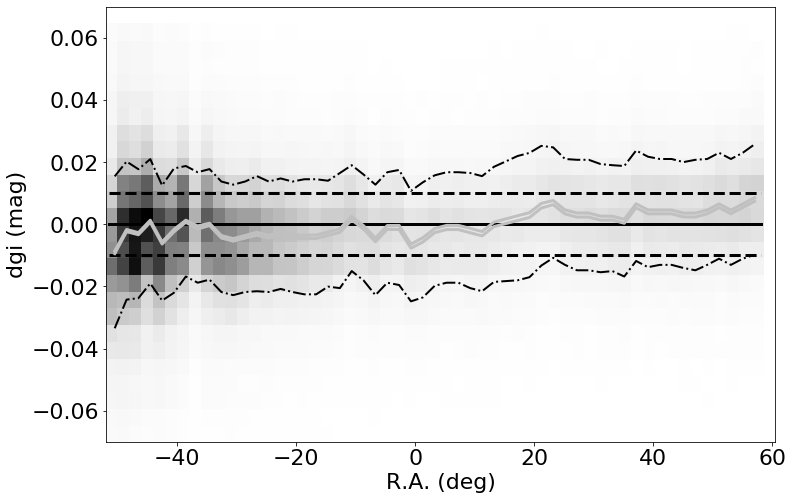

made plot testV26vsV33_r_dgi_RA_Hess.png
-----------
 stats for Dec binning medians:
medianAll: -0.0010000000000012221 std.dev.All: 0.019265999999999853
N= 989623 min= -0.29900000000000304 max= 0.29999999999999716
median: 0.0 std.dev: 0.0075259904693253275
saved plot as: testV26vsV33_r_dgi_Dec.png


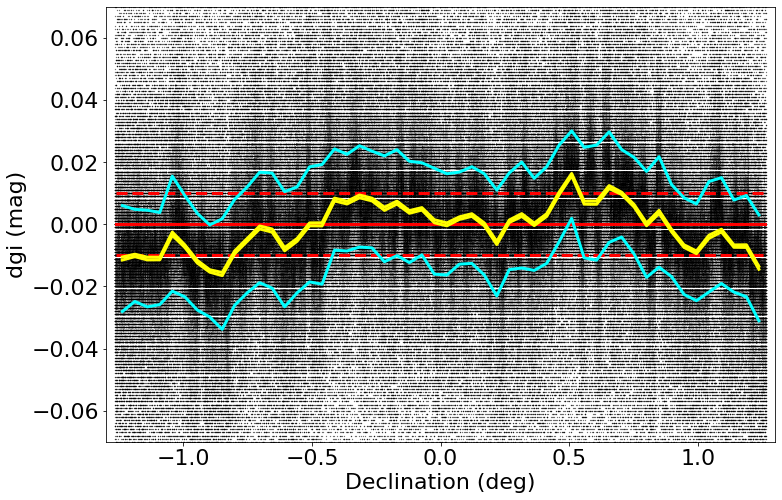

medianAll: -0.0010000000000012221 std.dev.All: 0.019265999999999853
N= 989623 min= -0.29900000000000304 max= 0.29999999999999716
median: 0.0 std.dev: 0.007681984936328536
saved plot as: testV26vsV33_r_dgi_Dec_Hess.png


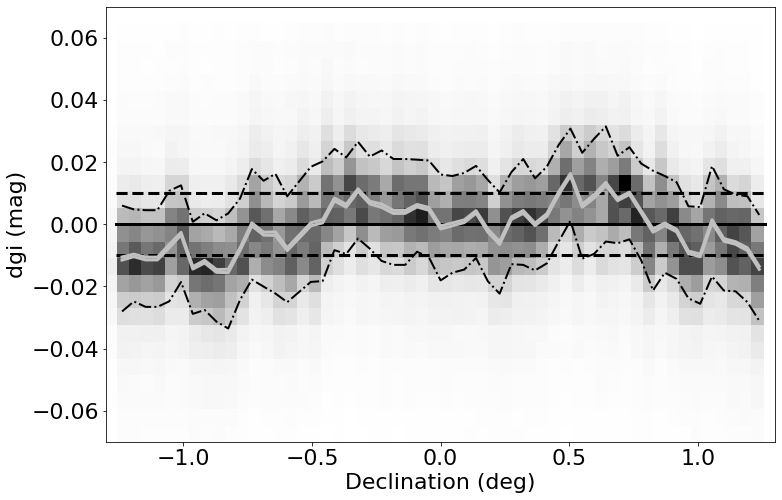

made plot testV26vsV33_r_dgi_Dec_Hess.png
-----------
 stats for SDSS r binning medians:
medianAll: -0.0010000000000012221 std.dev.All: 0.019265999999999853
N= 989623 min= -0.29900000000000304 max= 0.29999999999999716
median: -0.0009999999999994458 std.dev: 0.0006402478858785306
saved plot as: testV26vsV33_r_dgi_rmag.png


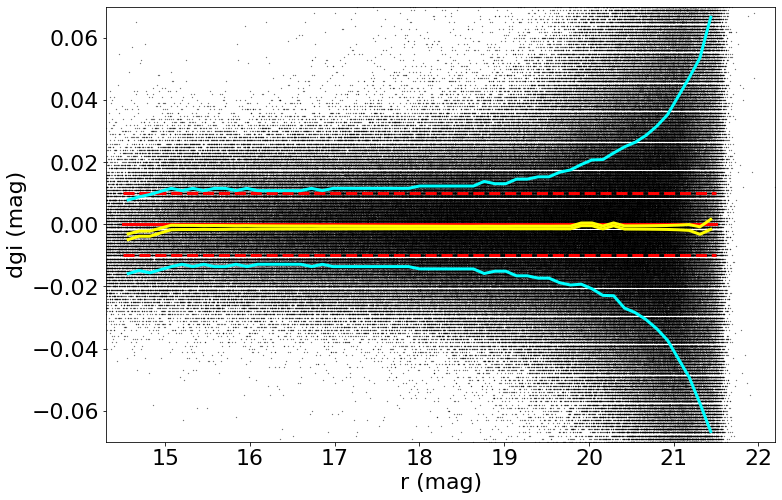

medianAll: -0.0010000000000012221 std.dev.All: 0.019265999999999853
N= 989623 min= -0.29900000000000304 max= 0.29999999999999716
median: -0.0009999999999994458 std.dev: 0.0006402478858785306
saved plot as: testV26vsV33_r_dgi_r_mag_Hess.png


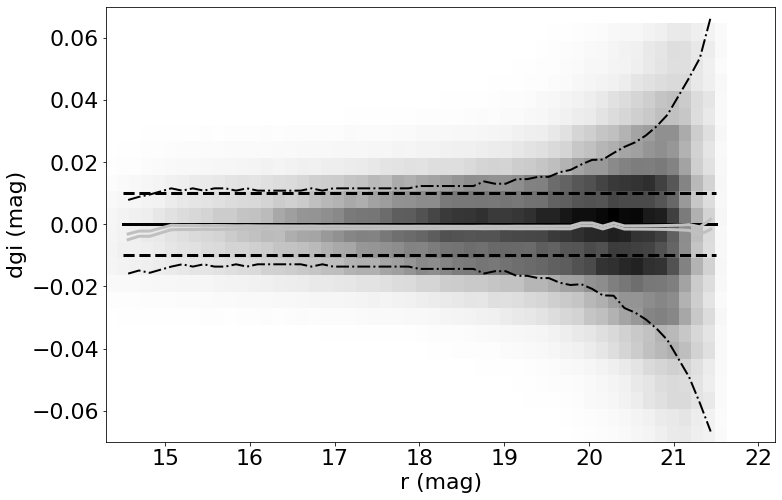

made plot testV26vsV33_r_dgi_r_mag_Hess.png
------------------------------------------------------------------


In [26]:
keywords = {"Xstr":'r', "plotNameRoot":'testV26vsV33_', "symbSize":0.05}
keywords["Ystr"] = 'dgi'
doOneBand(mOK3, keywords)

In [27]:
mOKw = mOK3[(mOK3['gr']>0.3)&(mOK3['gr']<1.0)&(mOK3['r_mMed_new']<19)]  
# 425,115 from 991,437 w/o r cut and 237,548 with r<19

=========== WORKING ON: w_old ===================
 stats for RA binning medians:
medianAll: -0.0005089999999990172 std.dev.All: 0.010476257999999329
N= 237522 min= -0.09069099999999766 max= 0.29812400000000333
median: -0.0013427499999980955 std.dev: 0.0026335866908266873
saved plot as: testV26vsV33_r_w_old_RA.png


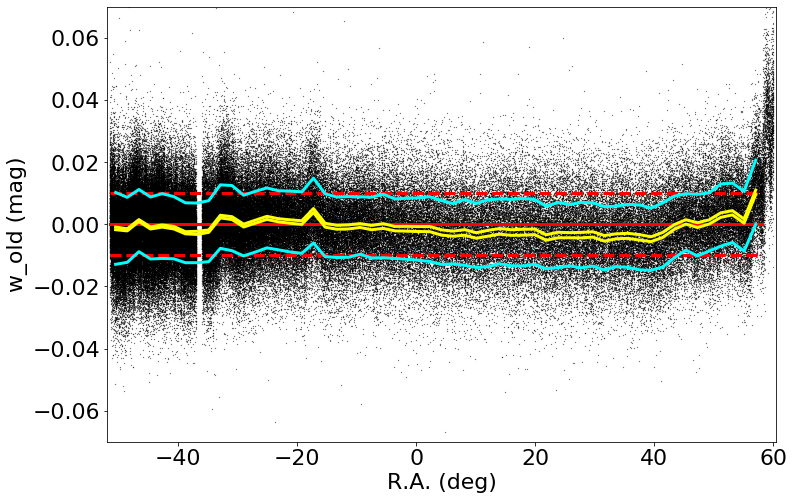

medianAll: -0.0005089999999990172 std.dev.All: 0.010476257999999329
N= 237522 min= -0.09069099999999766 max= 0.29812400000000333
median: -0.001267999999997639 std.dev: 0.0026403061445330277
saved plot as: testV26vsV33_r_w_old_RA_Hess.png


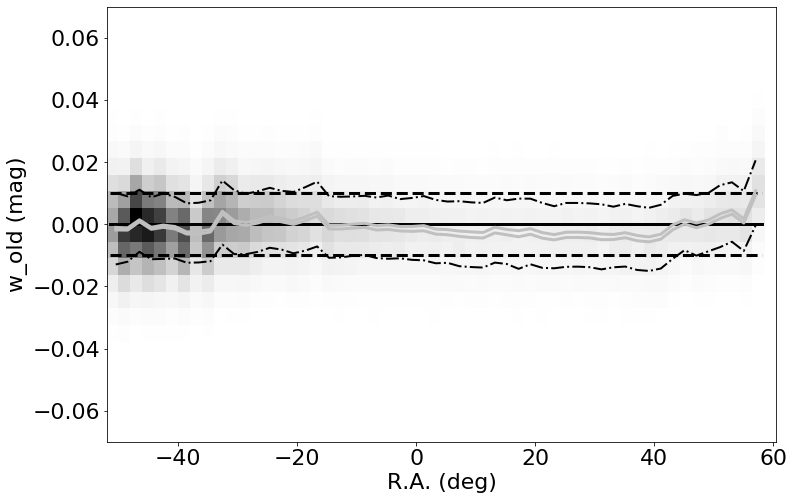

made plot testV26vsV33_r_w_old_RA_Hess.png
-----------
 stats for Dec binning medians:
medianAll: -0.0005089999999990172 std.dev.All: 0.010476257999999329
N= 237522 min= -0.09069099999999766 max= 0.29812400000000333
median: -0.00030349999999827043 std.dev: 0.0010713397450807204
saved plot as: testV26vsV33_r_w_old_Dec.png


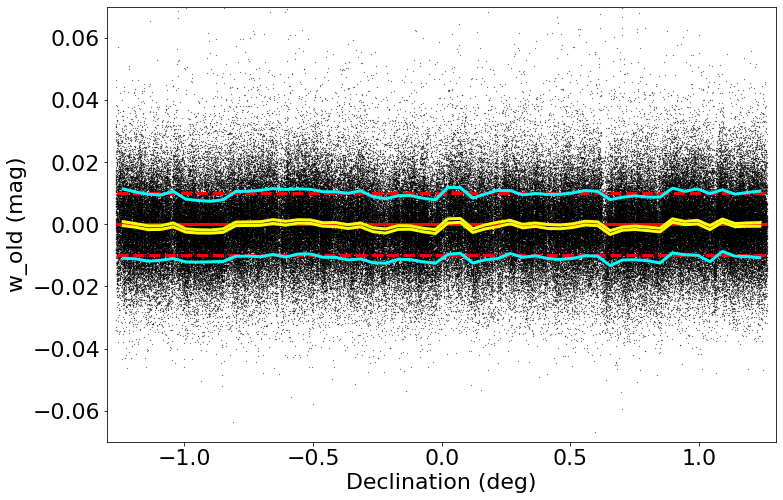

medianAll: -0.0005089999999990172 std.dev.All: 0.010476257999999329
N= 237522 min= -0.09069099999999766 max= 0.29812400000000333
median: -0.00033449999999816266 std.dev: 0.0010878703942614229
saved plot as: testV26vsV33_r_w_old_Dec_Hess.png


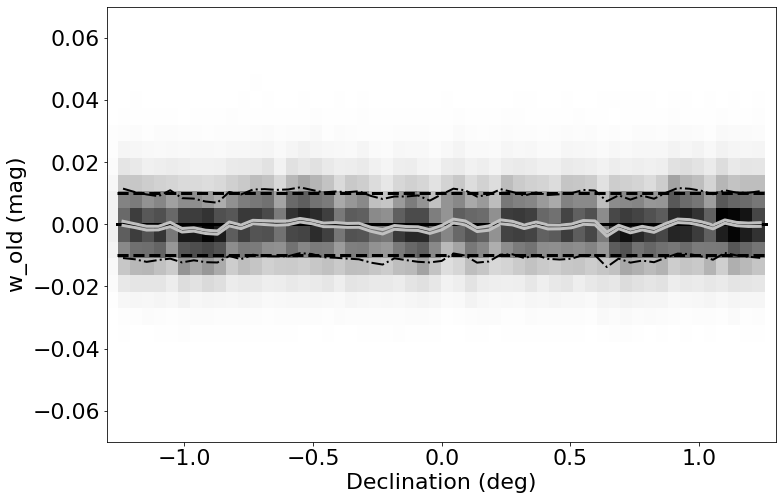

made plot testV26vsV33_r_w_old_Dec_Hess.png
-----------
 stats for SDSS r binning medians:
medianAll: -0.0005089999999990172 std.dev.All: 0.010476257999999329
N= 237522 min= -0.09069099999999766 max= 0.29812400000000333
median: -0.00047899999999793247 std.dev: 0.0010942844090377178
saved plot as: testV26vsV33_r_w_old_rmag.png


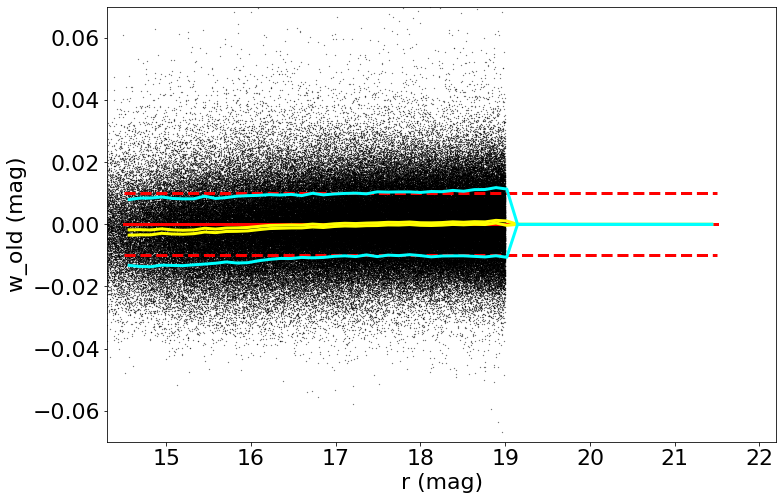

medianAll: -0.0005089999999990172 std.dev.All: 0.010476257999999329
N= 237522 min= -0.09069099999999766 max= 0.29812400000000333
median: -0.00047899999999793247 std.dev: 0.0010942844090377178
saved plot as: testV26vsV33_r_w_old_r_mag_Hess.png


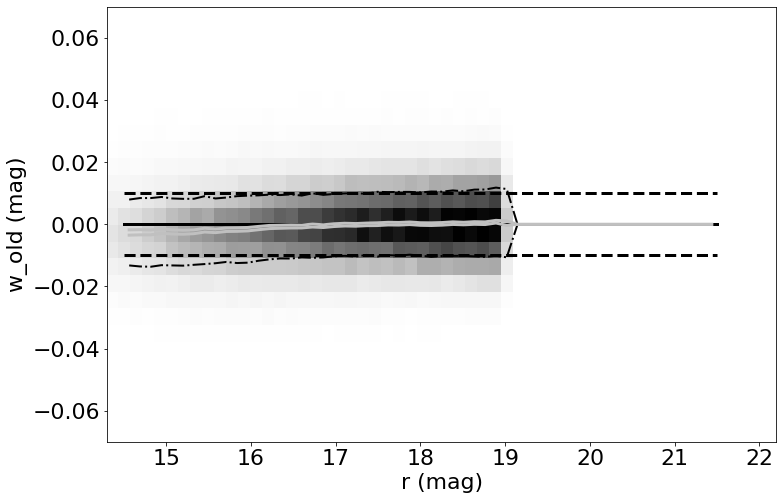

made plot testV26vsV33_r_w_old_r_mag_Hess.png
------------------------------------------------------------------


In [28]:
keywords = {"Xstr":'r', "plotNameRoot":'testV26vsV33_', "symbSize":0.05}
keywords["Ystr"] = 'w_old'
doOneBand(mOKw, keywords)

=========== WORKING ON: w_new ===================
 stats for RA binning medians:
medianAll: -0.001217999999999532 std.dev.All: 0.009488505000001448
N= 237489 min= -0.09975000000000003 max= 0.295599000000003
median: -0.0006209999999995733 std.dev: 0.0010128824585903882
saved plot as: testV26vsV33_r_w_new_RA.png


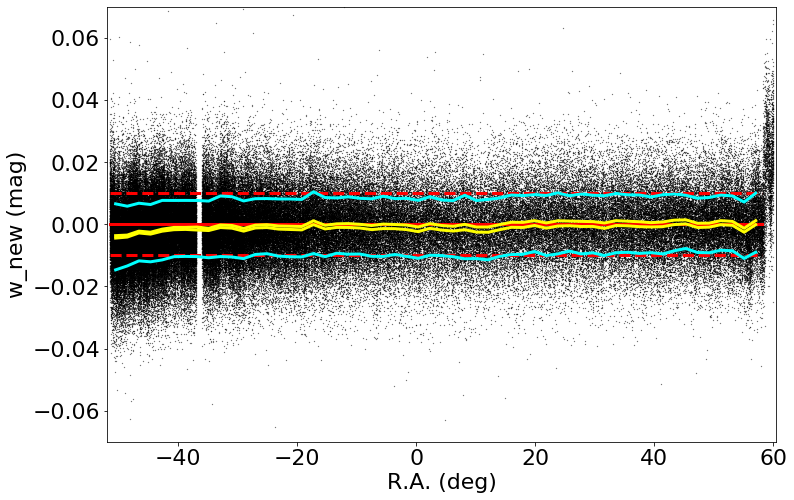

medianAll: -0.001217999999999532 std.dev.All: 0.009488505000001448
N= 237489 min= -0.09975000000000003 max= 0.295599000000003
median: -0.0006909999999995878 std.dev: 0.0010257878720025346
saved plot as: testV26vsV33_r_w_new_RA_Hess.png


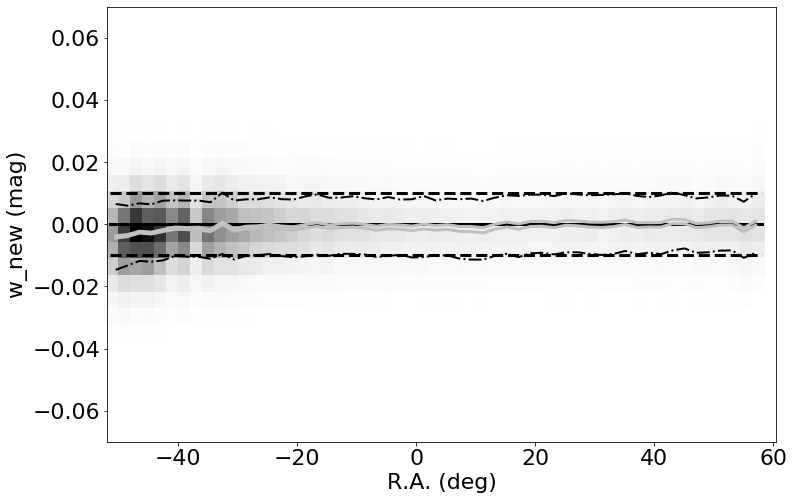

made plot testV26vsV33_r_w_new_RA_Hess.png
-----------
 stats for Dec binning medians:
medianAll: -0.001217999999999532 std.dev.All: 0.009488505000001448
N= 237489 min= -0.09975000000000003 max= 0.295599000000003
median: -0.001236499999998121 std.dev: 0.00032804581462086806
saved plot as: testV26vsV33_r_w_new_Dec.png


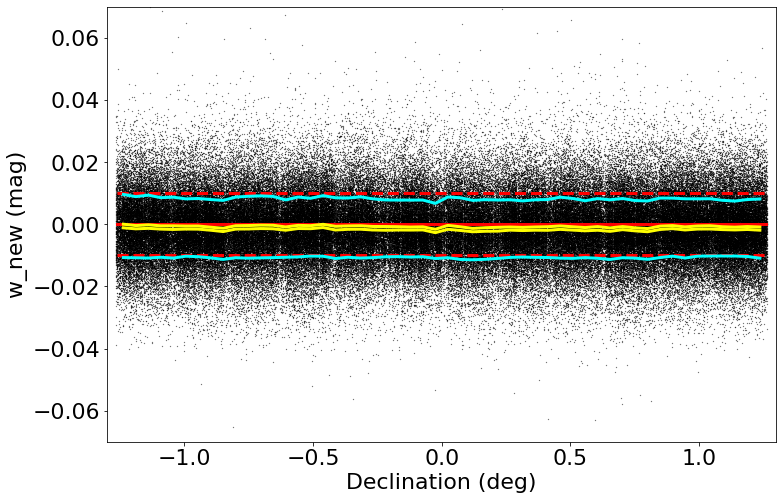

medianAll: -0.001217999999999532 std.dev.All: 0.009488505000001448
N= 237489 min= -0.09975000000000003 max= 0.295599000000003
median: -0.0012239999999985943 std.dev: 0.0003541519557599289
saved plot as: testV26vsV33_r_w_new_Dec_Hess.png


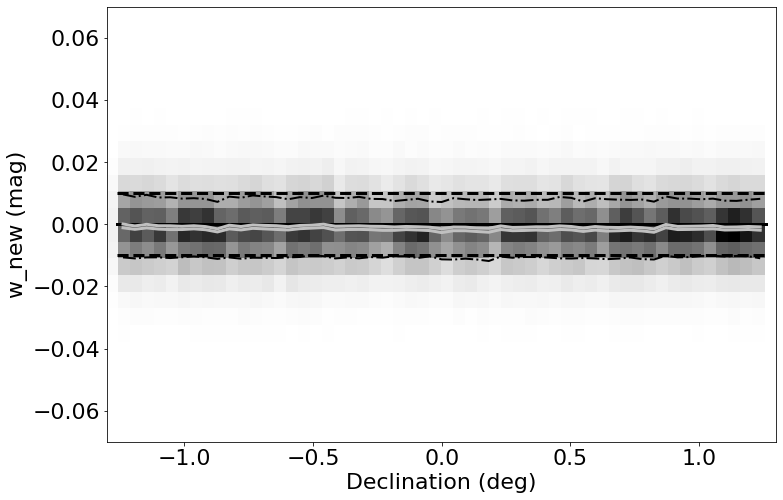

made plot testV26vsV33_r_w_new_Dec_Hess.png
-----------
 stats for SDSS r binning medians:
medianAll: -0.001217999999999532 std.dev.All: 0.009488505000001448
N= 237489 min= -0.09975000000000003 max= 0.295599000000003
median: -0.0010304999999968603 std.dev: 0.0007618949238578055
saved plot as: testV26vsV33_r_w_new_rmag.png


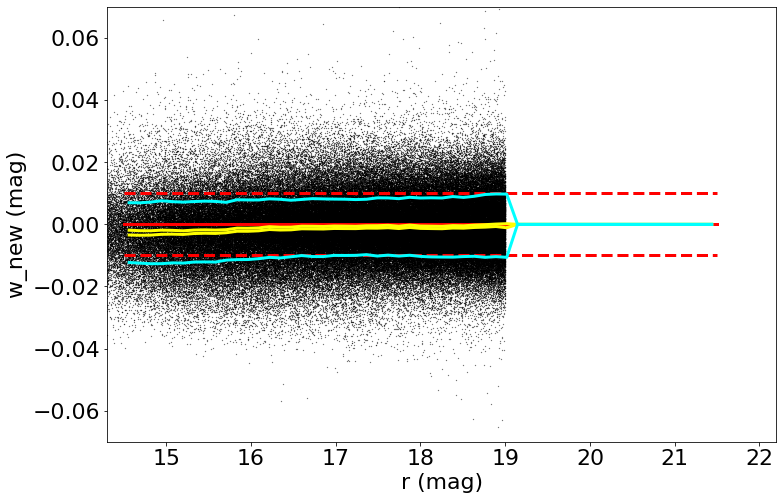

medianAll: -0.001217999999999532 std.dev.All: 0.009488505000001448
N= 237489 min= -0.09975000000000003 max= 0.295599000000003
median: -0.0010304999999968603 std.dev: 0.0007618949238578055
saved plot as: testV26vsV33_r_w_new_r_mag_Hess.png


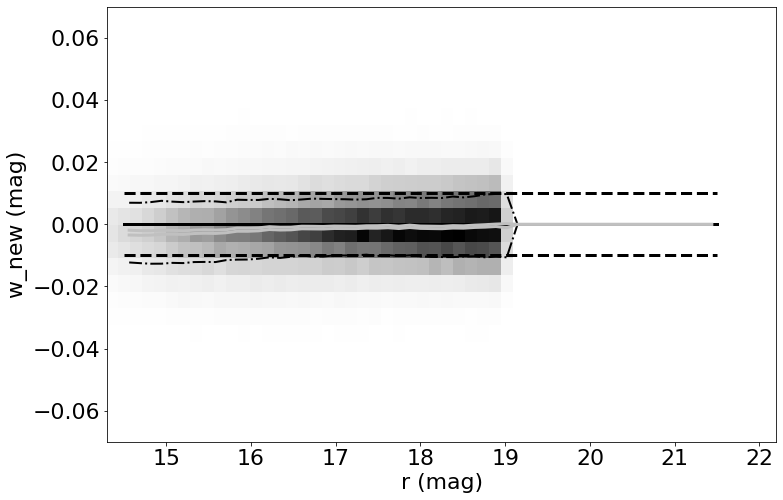

made plot testV26vsV33_r_w_new_r_mag_Hess.png
------------------------------------------------------------------


In [29]:
keywords = {"Xstr":'r', "plotNameRoot":'testV26vsV33_', "symbSize":0.05}
keywords["Ystr"] = 'w_new'
doOneBand(mOKw, keywords)

In [30]:
mOKwB = mOKw[(mOKw['r']>16)&(mOKw['r']<19)&(np.abs(mOKw['w_new'])<0.06)]
ww = mOKwB['w_new']
np.std(ww)

0.010314158504735861

In [31]:
mOKs = mOK3[(mOK3['sP1_new']>-0.2)&(mOK3['sP1_new']<0.8)&(np.abs(mOK3['s_new'])<0.2)]  
# 425,115 from 991,437 w/o r cut and 237,548 with r<19
mOKsB = mOKs[(mOKs['u_mMed_new']>16)&(mOKs['u_mMed_new']<21)] 

medianAll: 0.0017140000000004652 std.dev.All: 0.02655799574999883
N= 301742 min= -0.1998690000000016 max= 0.19995099999999846
median: 0.0028749999999993225 std.dev: 0.0037994534337927755


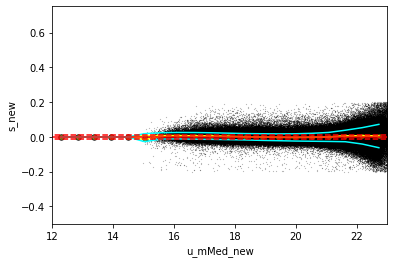

In [32]:
zit.qpBM(mOKs, 'u_mMed_new', 12, 23, 's_new', -0.5, 0.75, 20)

=========== WORKING ON: s_old ===================
 stats for RA binning medians:
medianAll: 0.0016290000000010185 std.dev.All: 0.020230781999999132
N= 183285 min= -0.21053400000000108 max= 0.19786499999999999
median: 0.0011347499999987687 std.dev: 0.007375751926294334
saved plot as: testV26vsV33_sold_u_s_old_RA.png


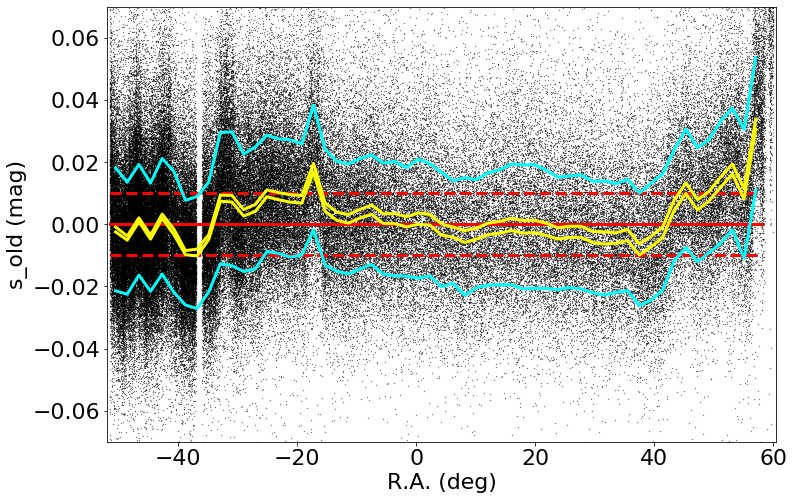

medianAll: 0.0016290000000010185 std.dev.All: 0.020230781999999132
N= 183285 min= -0.21053400000000108 max= 0.19786499999999999
median: 0.0006599999999996886 std.dev: 0.007331796710028788
saved plot as: testV26vsV33_sold_u_s_old_RA_Hess.png


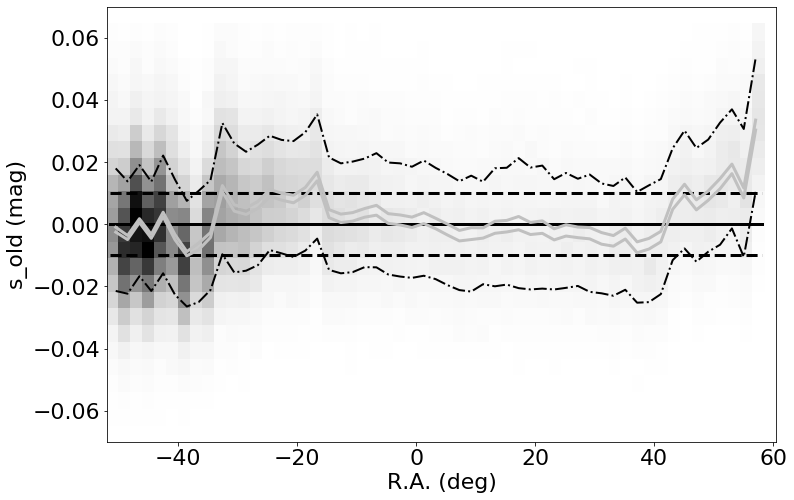

made plot testV26vsV33_sold_u_s_old_RA_Hess.png
-----------
 stats for Dec binning medians:
medianAll: 0.0016290000000010185 std.dev.All: 0.020230781999999132
N= 183285 min= -0.21053400000000108 max= 0.19786499999999999
median: 0.001557749999999719 std.dev: 0.001484529001416423
saved plot as: testV26vsV33_sold_u_s_old_Dec.png


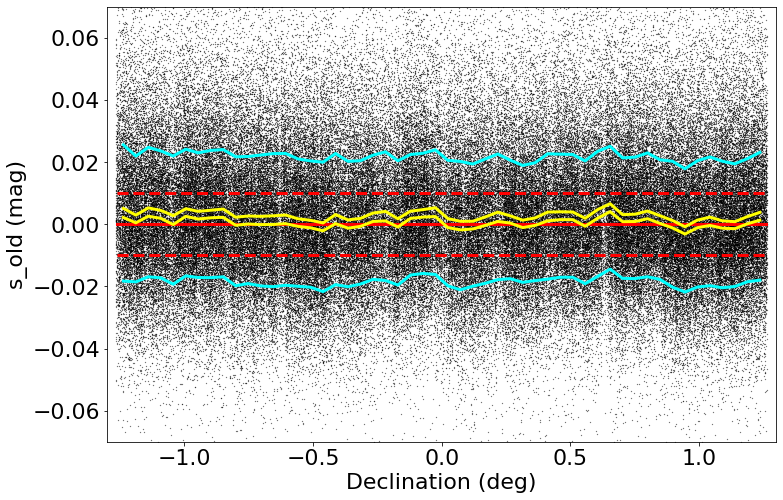

medianAll: 0.0016290000000010185 std.dev.All: 0.020230781999999132
N= 183285 min= -0.21053400000000108 max= 0.19786499999999999
median: 0.0017159999999980802 std.dev: 0.0015241507974026874
saved plot as: testV26vsV33_sold_u_s_old_Dec_Hess.png


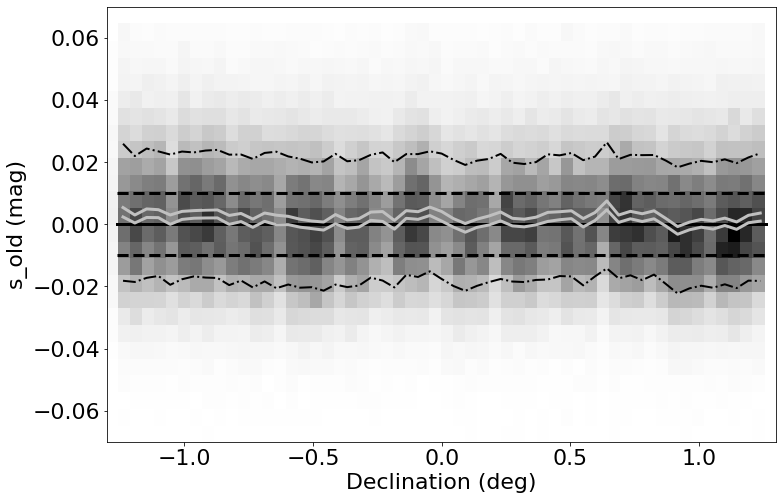

made plot testV26vsV33_sold_u_s_old_Dec_Hess.png
-----------
 stats for SDSS r binning medians:
medianAll: 0.0016290000000010185 std.dev.All: 0.020230781999999132
N= 183285 min= -0.21053400000000108 max= 0.19786499999999999
median: 0.0016760000000013708 std.dev: 0.0031809900035580834
saved plot as: testV26vsV33_sold_u_s_old_rmag.png


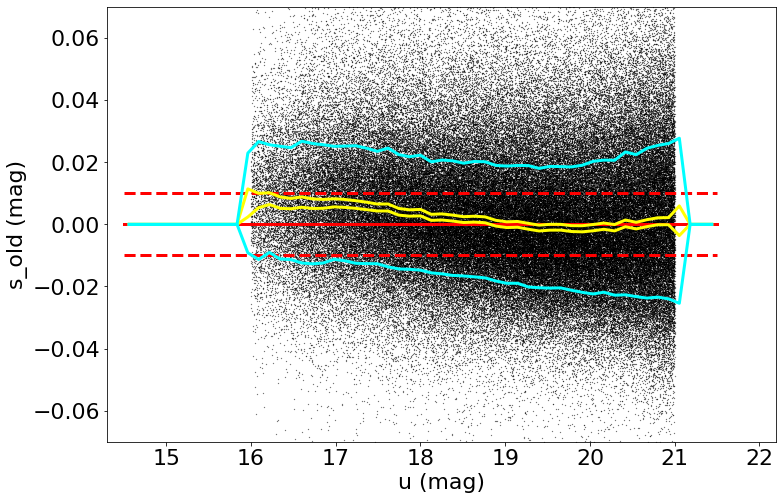

medianAll: 0.0016290000000010185 std.dev.All: 0.020230781999999132
N= 183285 min= -0.21053400000000108 max= 0.19786499999999999
median: 0.0016760000000013708 std.dev: 0.0031809900035580834
saved plot as: testV26vsV33_sold_u_s_old_u_mag_Hess.png


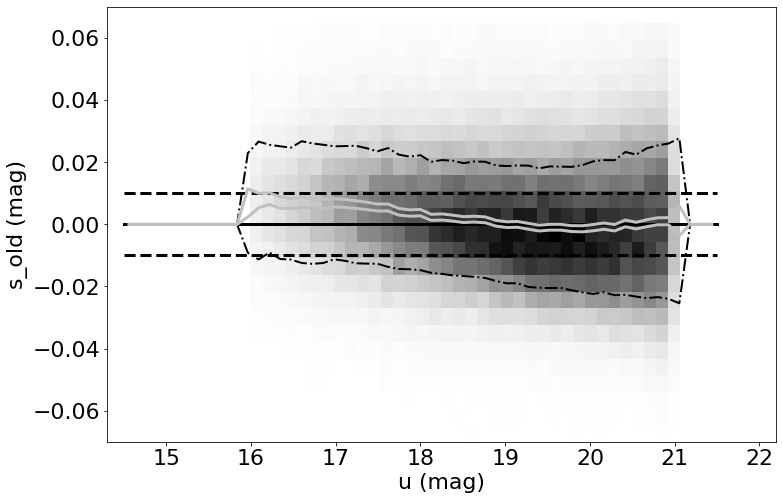

made plot testV26vsV33_sold_u_s_old_u_mag_Hess.png
------------------------------------------------------------------


In [33]:
keywords = {"Xstr":'u', "plotNameRoot":'testV26vsV33_sold_', "symbSize":0.05}
keywords["Ystr"] = 's_old'
doOneBand(mOKsB, keywords)

=========== WORKING ON: s_new ===================
 stats for RA binning medians:
medianAll: 0.00022200000000108244 std.dev.All: 0.020377499999999566
N= 183286 min= -0.1996759999999986 max= 0.19194899999999906
median: -0.0026174999999988013 std.dev: 0.009819958233052659
saved plot as: testV26vsV33_snew_u_s_new_RA.png


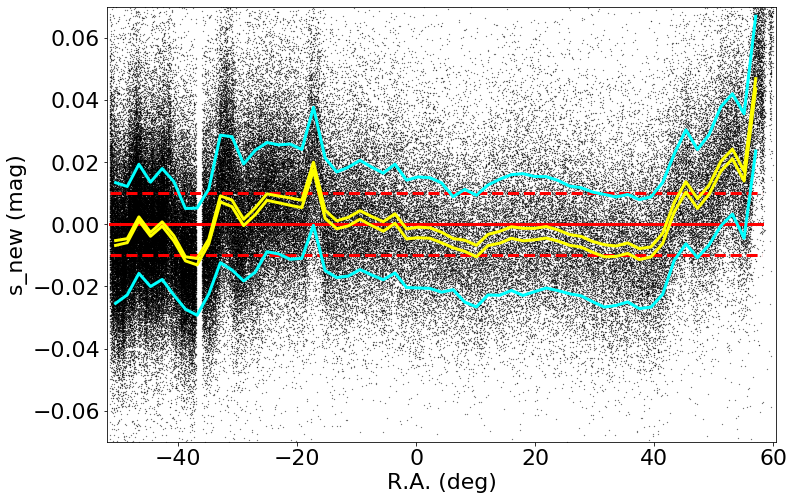

medianAll: 0.00022200000000108244 std.dev.All: 0.020377499999999566
N= 183286 min= -0.1996759999999986 max= 0.19194899999999906
median: -0.0021680000000012523 std.dev: 0.009778113068675362
saved plot as: testV26vsV33_snew_u_s_new_RA_Hess.png


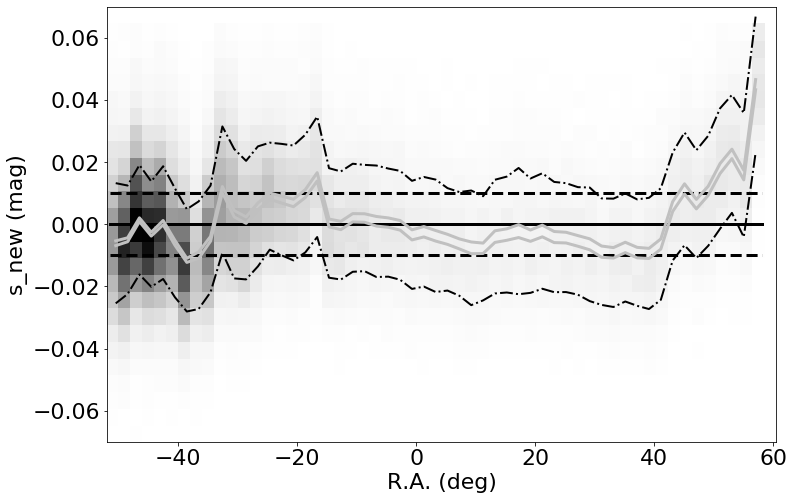

made plot testV26vsV33_snew_u_s_new_RA_Hess.png
-----------
 stats for Dec binning medians:
medianAll: 0.00022200000000108244 std.dev.All: 0.020377499999999566
N= 183286 min= -0.1996759999999986 max= 0.19194899999999906
median: 0.0003029999999986377 std.dev: 0.0013495426949468718
saved plot as: testV26vsV33_snew_u_s_new_Dec.png


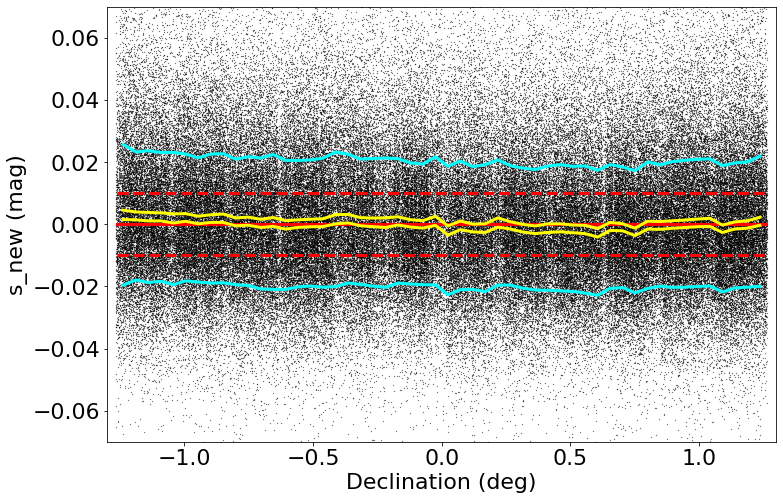

medianAll: 0.00022200000000108244 std.dev.All: 0.020377499999999566
N= 183286 min= -0.1996759999999986 max= 0.19194899999999906
median: 0.0004364999999982022 std.dev: 0.001365208911631172
saved plot as: testV26vsV33_snew_u_s_new_Dec_Hess.png


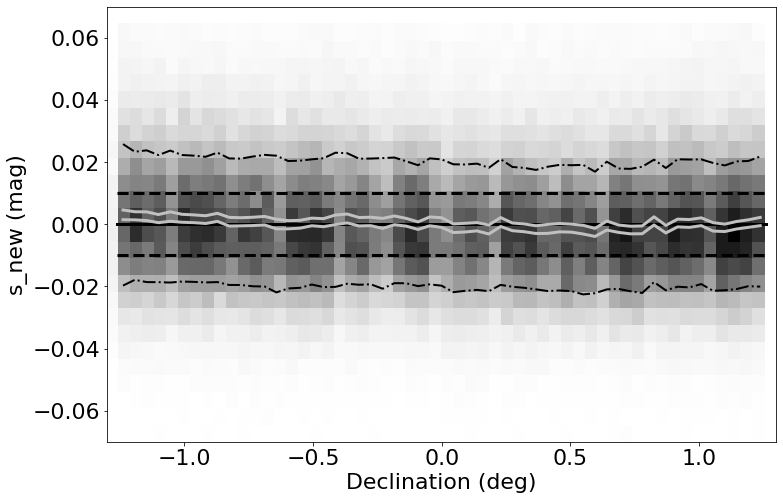

made plot testV26vsV33_snew_u_s_new_Dec_Hess.png
-----------
 stats for SDSS r binning medians:
medianAll: 0.00022200000000108244 std.dev.All: 0.020377499999999566
N= 183286 min= -0.1996759999999986 max= 0.19194899999999906
median: 0.00040200000000270575 std.dev: 0.003549820987602181
saved plot as: testV26vsV33_snew_u_s_new_rmag.png


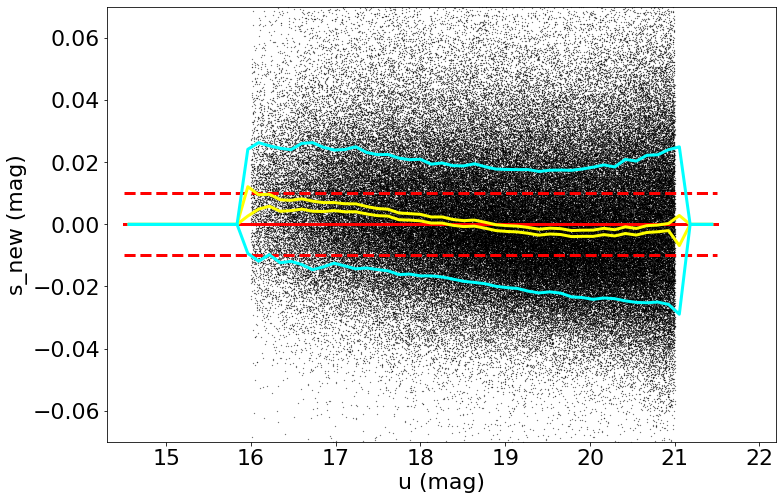

medianAll: 0.00022200000000108244 std.dev.All: 0.020377499999999566
N= 183286 min= -0.1996759999999986 max= 0.19194899999999906
median: 0.00040200000000270575 std.dev: 0.003549820987602181
saved plot as: testV26vsV33_snew_u_s_new_u_mag_Hess.png


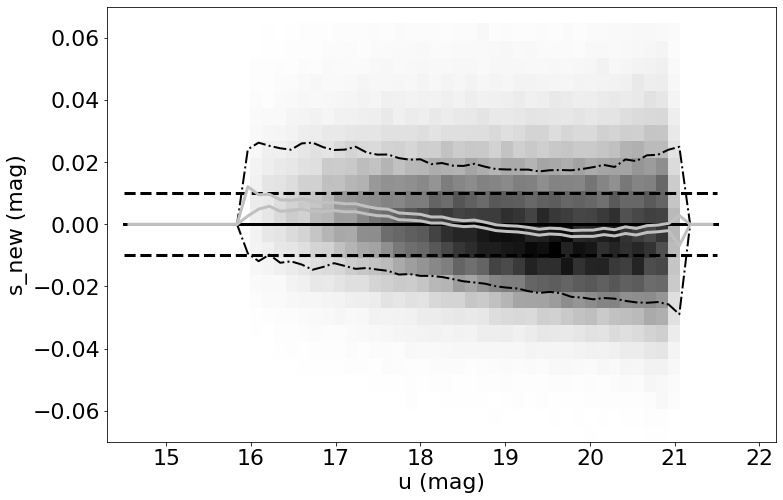

made plot testV26vsV33_snew_u_s_new_u_mag_Hess.png
------------------------------------------------------------------


In [34]:
keywords = {"Xstr":'u', "plotNameRoot":'testV26vsV33_snew_', "symbSize":0.05}
keywords["Ystr"] = 's_new'
doOneBand(mOKsB, keywords)

In [35]:
mOKy = mOK3[(mOK3['yP1_new']>0.1)&(mOK3['yP1_new']<1.2)&(np.abs(mOK3['y_new'])<0.2)]  
mOKyB = mOKy[(mOKy['z_mMed_new']>14)&(mOKy['z_mMed_new']<19)] 

medianAll: 3.999999998408055e-06 std.dev.All: 0.013099398000001377
N= 389746 min= -0.19793399999999778 max= 0.19887800000000283
median: 0.0030860000000002136 std.dev: 0.02834415159000817


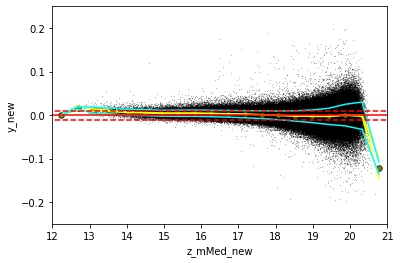

In [36]:
zit.qpBM(mOKy, 'z_mMed_new', 12, 21, 'y_new', -0.25, 0.25, 20)

=========== WORKING ON: y_old ===================
 stats for RA binning medians:
medianAll: 8.600000000187624e-05 std.dev.All: 0.011027562000000046
N= 229467 min= -0.11835000000000077 max= 0.18316599999999866
median: -0.001056999999998906 std.dev: 0.002713516781062805
saved plot as: testV26vsV33_yold_z_y_old_RA.png


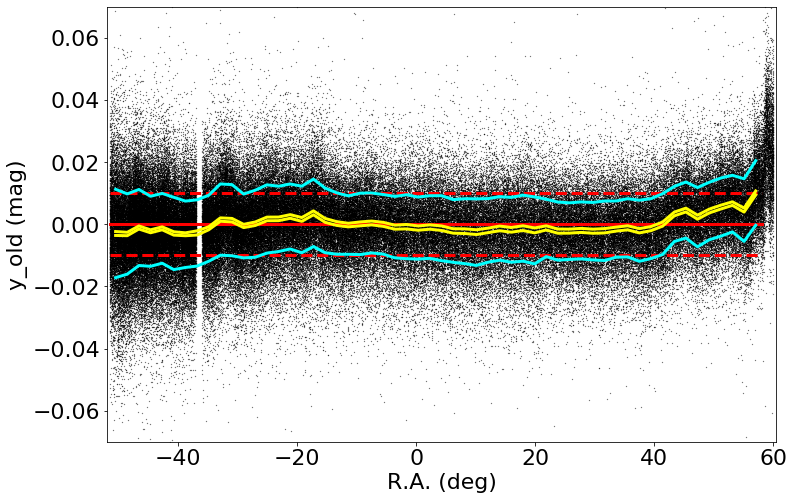

medianAll: 8.600000000187624e-05 std.dev.All: 0.011027562000000046
N= 229467 min= -0.11835000000000077 max= 0.18316599999999866
median: -0.0010789999999993166 std.dev: 0.002718162703125259
saved plot as: testV26vsV33_yold_z_y_old_RA_Hess.png


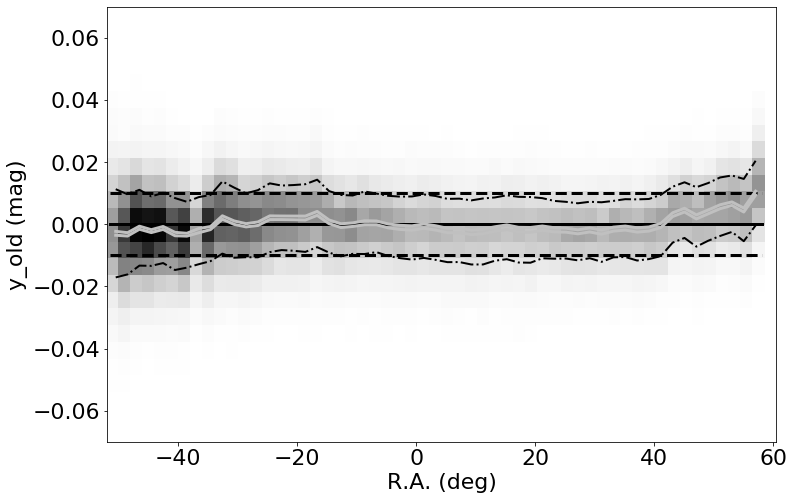

made plot testV26vsV33_yold_z_y_old_RA_Hess.png
-----------
 stats for Dec binning medians:
medianAll: 8.600000000187624e-05 std.dev.All: 0.011027562000000046
N= 229467 min= -0.11835000000000077 max= 0.18316599999999866
median: 8.899999999874286e-05 std.dev: 0.0007544435807230708
saved plot as: testV26vsV33_yold_z_y_old_Dec.png


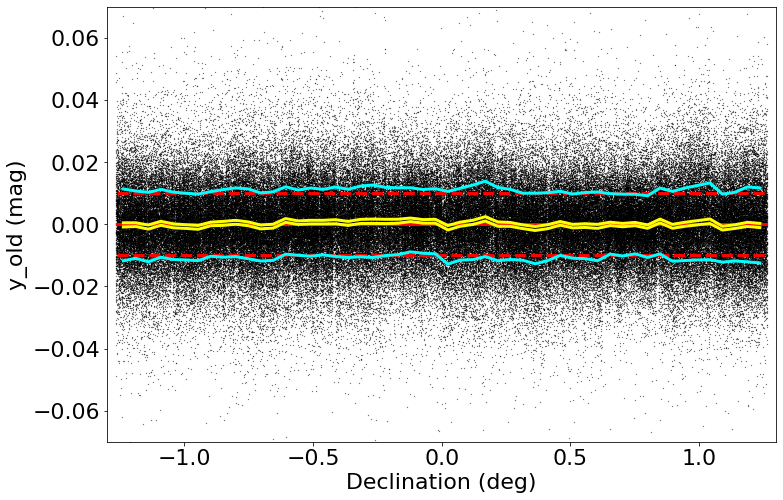

medianAll: 8.600000000187624e-05 std.dev.All: 0.011027562000000046
N= 229467 min= -0.11835000000000077 max= 0.18316599999999866
median: 2.0000000000644502e-05 std.dev: 0.0007443944555504959
saved plot as: testV26vsV33_yold_z_y_old_Dec_Hess.png


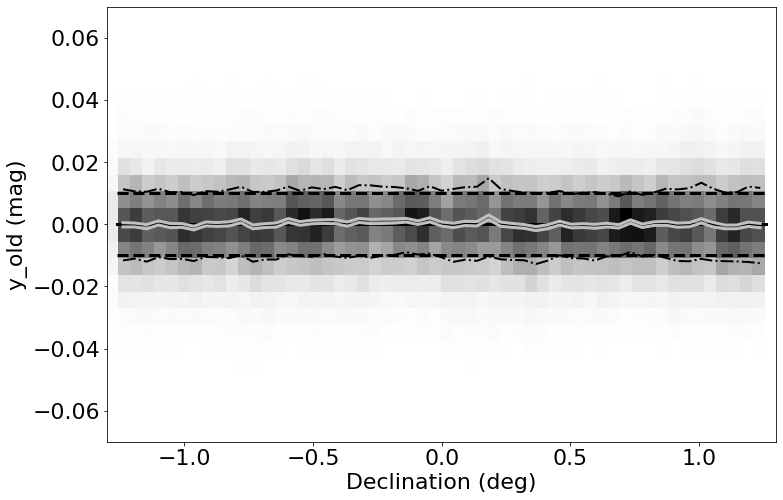

made plot testV26vsV33_yold_z_y_old_Dec_Hess.png
-----------
 stats for SDSS r binning medians:
medianAll: 8.600000000187624e-05 std.dev.All: 0.011027562000000046
N= 229467 min= -0.11835000000000077 max= 0.18316599999999866
median: 0.002458000000001251 std.dev: 0.0021974786159933706
saved plot as: testV26vsV33_yold_z_y_old_rmag.png


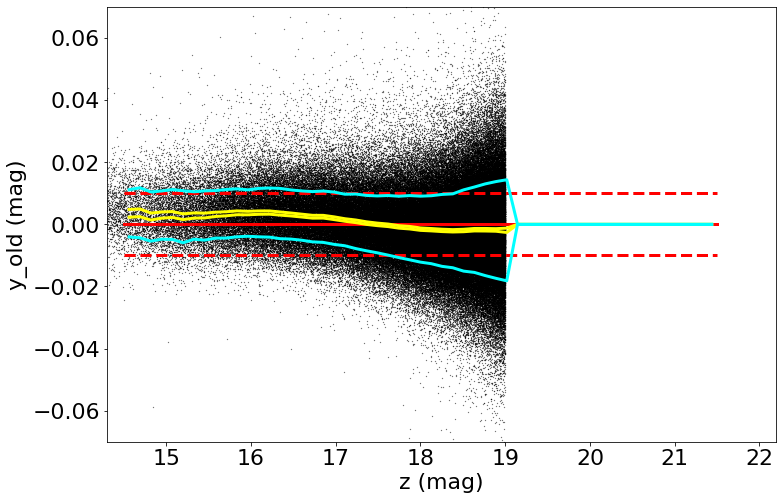

medianAll: 8.600000000187624e-05 std.dev.All: 0.011027562000000046
N= 229467 min= -0.11835000000000077 max= 0.18316599999999866
median: 0.002458000000001251 std.dev: 0.0021974786159933706
saved plot as: testV26vsV33_yold_z_y_old_z_mag_Hess.png


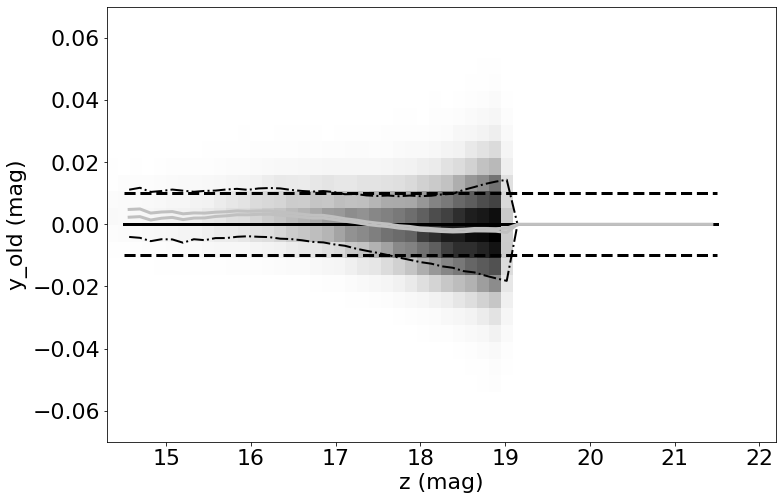

made plot testV26vsV33_yold_z_y_old_z_mag_Hess.png
------------------------------------------------------------------


In [37]:
keywords = {"Xstr":'z', "plotNameRoot":'testV26vsV33_yold_', "symbSize":0.05}
keywords["Ystr"] = 'y_old'
doOneBand(mOKyB, keywords)

=========== WORKING ON: y_new ===================
 stats for RA binning medians:
medianAll: 0.0006899999999992606 std.dev.All: 0.010181339999996937
N= 229467 min= -0.1926059999999991 max= 0.18988600000000005
median: 0.00035000000000058595 std.dev: 0.0017666075922187683
saved plot as: testV26vsV33_ynew_z_y_new_RA.png


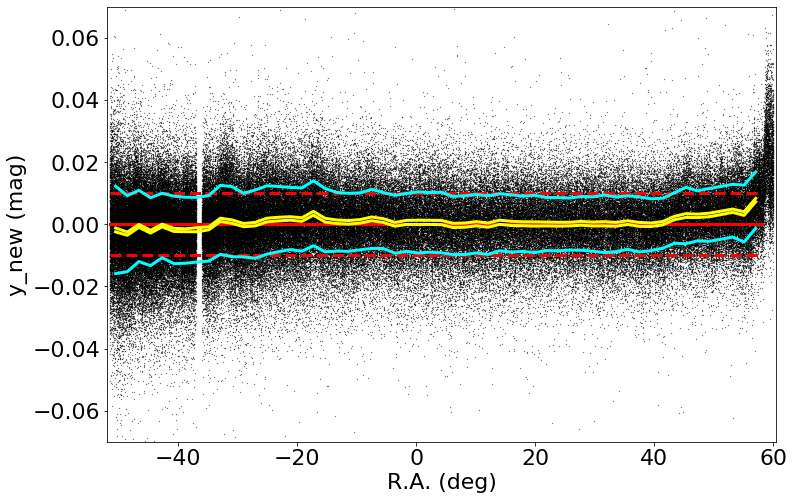

medianAll: 0.0006899999999992606 std.dev.All: 0.010181339999996937
N= 229467 min= -0.1926059999999991 max= 0.18988600000000005
median: 0.0003179999999987776 std.dev: 0.0017744735700787329
saved plot as: testV26vsV33_ynew_z_y_new_RA_Hess.png


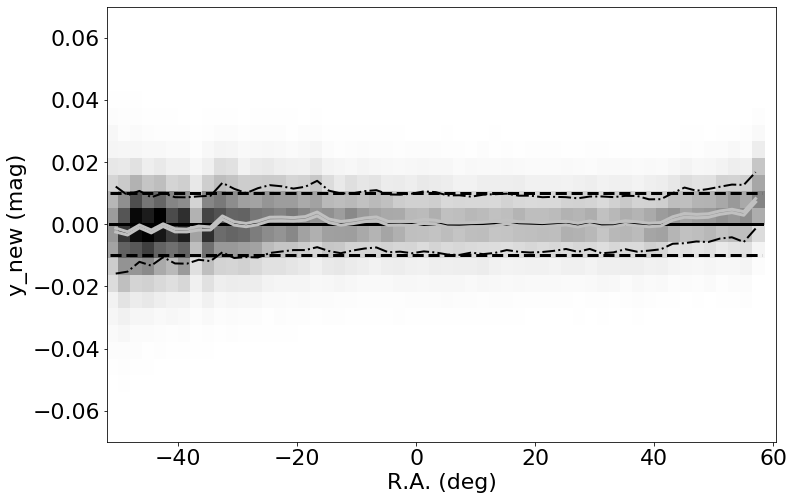

made plot testV26vsV33_ynew_z_y_new_RA_Hess.png
-----------
 stats for Dec binning medians:
medianAll: 0.0006899999999992606 std.dev.All: 0.010181339999996937
N= 229467 min= -0.1926059999999991 max= 0.18988600000000005
median: -0.00011299999999929422 std.dev: 0.003442920017305613
saved plot as: testV26vsV33_ynew_z_y_new_Dec.png


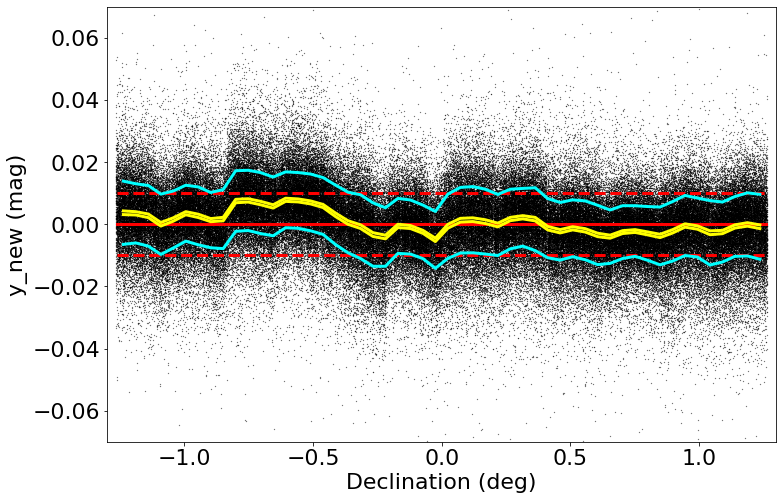

medianAll: 0.0006899999999992606 std.dev.All: 0.010181339999996937
N= 229467 min= -0.1926059999999991 max= 0.18988600000000005
median: 4.999999999436011e-06 std.dev: 0.00345164787503354
saved plot as: testV26vsV33_ynew_z_y_new_Dec_Hess.png


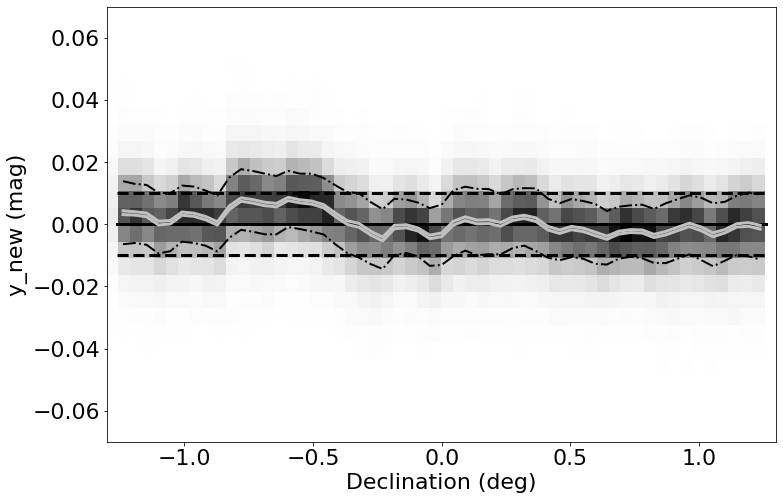

made plot testV26vsV33_ynew_z_y_new_Dec_Hess.png
-----------
 stats for SDSS r binning medians:
medianAll: 0.0006899999999992606 std.dev.All: 0.010181339999996937
N= 229467 min= -0.1926059999999991 max= 0.18988600000000005
median: 0.0029795000000017585 std.dev: 0.00253155625704058
saved plot as: testV26vsV33_ynew_z_y_new_rmag.png


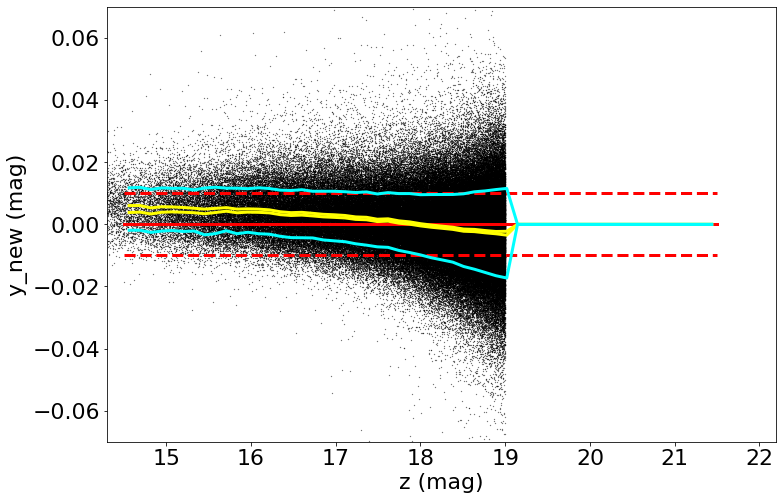

medianAll: 0.0006899999999992606 std.dev.All: 0.010181339999996937
N= 229467 min= -0.1926059999999991 max= 0.18988600000000005
median: 0.0029795000000017585 std.dev: 0.00253155625704058
saved plot as: testV26vsV33_ynew_z_y_new_z_mag_Hess.png


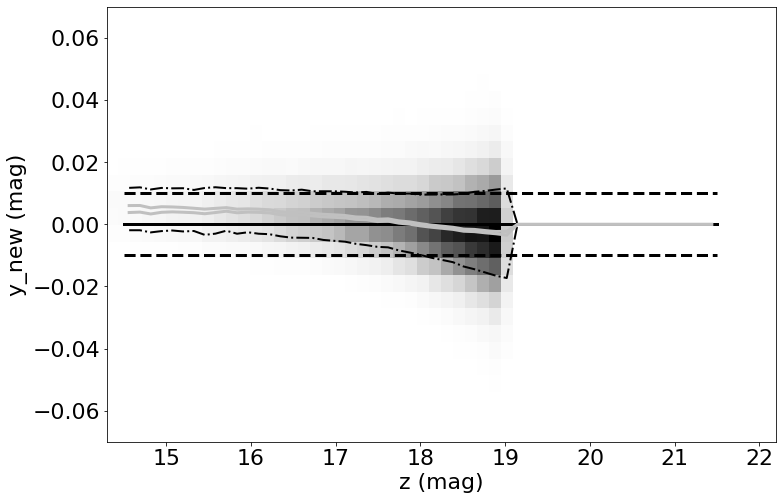

made plot testV26vsV33_ynew_z_y_new_z_mag_Hess.png
------------------------------------------------------------------


In [38]:
keywords = {"Xstr":'z', "plotNameRoot":'testV26vsV33_ynew_', "symbSize":0.05}
keywords["Ystr"] = 'y_new'
doOneBand(mOKyB, keywords)